In [50]:
import os  # Operating system specific functionalities
import numpy as np  # Linear algebra
import pandas as pd  # Data processing, CSV file I/O (e.g. pd.read_csv)
from IPython.display import Image  # Displaying images in Jupyter Notebook
import matplotlib.pyplot as plt  # Plotting library
import seaborn as sns  # Statistical data visualization
%matplotlib inline
import pickle as pkl  # Python object serialization
import altair as alt  # Declarative statistical visualization library
from tabulate import tabulate  # Pretty-print tabular data
from colorama import Fore, Style  # ANSI escape sequences for colored terminal text
from scipy.stats import pearsonr  # Pearson correlation coefficient and p-value computation
from mpl_toolkits.mplot3d import Axes3D  # 3D plotting toolkit for Matplotlib
from sklearn.cluster import KMeans  # K-Means clustering algorithm
from sklearn.preprocessing import StandardScaler  # Standardization of features
from sklearn.decomposition import PCA  # Principal Component Analysis
from scipy.stats import chi2  # Chi-square distribution
from sklearn.ensemble import RandomForestClassifier  # Random Forest classifier
import xgboost as xgb  # XGBoost library for gradient boosting
import lightgbm as lgb  # LightGBM library for gradient boosting

# Import necessary libraries for model training and evaluation
from sklearn.model_selection import train_test_split  # Splitting data into train and test sets
from xgboost import XGBClassifier  # XGBoost classifier
from lightgbm import LGBMClassifier  # LightGBM classifier
from catboost import CatBoostClassifier  # CatBoost classifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix  # For model evaluation

import warnings  # Suppress warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)  # Display all columns in DataFrame
pd.set_option('display.max_rows', None)  # Display all rows in DataFrame

In [51]:
df_train =pd.read_csv (r"C:\Users\sunil\Downloads\ObesityDataSet_raw_and_data_sinthetic.csv")

In [52]:
print('Number of rows and columns:\n')
df_train.shape

Number of rows and columns:



(2111, 17)

In [53]:
df_train.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.0,1.62,64.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,Normal_Weight
1,Female,21.0,1.52,56.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.0,1.80,77.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,Normal_Weight
3,Male,27.0,1.80,87.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,Overweight_Level_I
4,Male,22.0,1.78,89.8,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,Overweight_Level_II


In [54]:
df_train.tail()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
2106,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesity_Type_III
2110,Female,23.664709,1.738836,133.472641,yes,yes,3.0,3.0,Sometimes,no,2.863513,no,1.026452,0.714137,Sometimes,Public_Transportation,Obesity_Type_III


In [55]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2111 non-null   object 
 1   Age                             2111 non-null   float64
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   object 
 5   FAVC                            2111 non-null   object 
 6   FCVC                            2111 non-null   float64
 7   NCP                             2111 non-null   float64
 8   CAEC                            2111 non-null   object 
 9   SMOKE                           2111 non-null   object 
 10  CH2O                            2111 non-null   float64
 11  SCC                             2111 non-null   object 
 12  FAF                             21

In [56]:
print("size of dataframe:",df_train.size)
df_train.dtypes

size of dataframe: 35887


Gender                             object
Age                               float64
Height                            float64
Weight                            float64
family_history_with_overweight     object
FAVC                               object
FCVC                              float64
NCP                               float64
CAEC                               object
SMOKE                              object
CH2O                              float64
SCC                                object
FAF                               float64
TUE                               float64
CALC                               object
MTRANS                             object
NObeyesdad                         object
dtype: object

In [57]:
df_train.describe().transpose().style.background_gradient(cmap='viridis').format("{:.2f}")

,count,mean,std,min,25%,50%,75%,max
Age,2111.00,24.31,6.35,14.00,19.95,22.78,26.00,61.00
Height,2111.00,1.70,0.09,1.45,1.63,1.70,1.77,1.98
Weight,2111.00,86.59,26.19,39.00,65.47,83.00,107.43,173.00
FCVC,2111.00,2.42,0.53,1.00,2.00,2.39,3.00,3.00
NCP,2111.00,2.69,0.78,1.00,2.66,3.00,3.00,4.00
CH2O,2111.00,2.01,0.61,1.00,1.58,2.00,2.48,3.00
FAF,2111.00,1.01,0.85,0.00,0.12,1.00,1.67,3.00
TUE,2111.00,0.66,0.61,0.00,0.00,0.63,1.00,2.00


In [58]:
def summary(dataframe):
    print(f'Data shape: {dataframe.shape}')                                 # Print the shape of the dataframe  
    summary_df = pd.DataFrame(dataframe.dtypes, columns=['Data Type'])      # Create a dataframe to store summary information
    summary_df['# Missing'] = dataframe.isnull().sum().values               # Count the number of missing values for each column 
    summary_df['% Missing'] = (dataframe.isnull().sum().values / len(dataframe)) * 100 # Calculate the percentage of missing values for each column
    summary_df['# Unique'] = dataframe.nunique().values                     # Count the number of unique values for each column
    desc = pd.DataFrame(dataframe.describe(include='all').transpose())      # Create a descriptive statistics df & transpose it for easier merging
    summary_df['Min'] = desc['min'].values                                  # Add the minimum values from the descriptive statistics 
    summary_df['Max'] = desc['max'].values                                  # Add the maximum values from the descriptive statistics 

    return summary_df                                                       

# Call the function with the dataframe "df_train" and display the summary
summary(df_train)

Data shape: (2111, 17)


,Data Type,# Missing,% Missing,# Unique,Min,Max
Gender,object,0,0.0,2,NaN,NaN
Age,float64,0,0.0,1402,14.0,61.0
Height,float64,0,0.0,1574,1.45,1.98
Weight,float64,0,0.0,1525,39.0,173.0
family_history_with_overweight,object,0,0.0,2,NaN,NaN
FAVC,object,0,0.0,2,NaN,NaN
FCVC,float64,0,0.0,810,1.0,3.0
NCP,float64,0,0.0,635,1.0,4.0
CAEC,object,0,0.0,4,NaN,NaN
SMOKE,object,0,0.0,2,NaN,NaN


In [59]:
df_train.groupby('NObeyesdad').count().iloc[:,1]

NObeyesdad
Insufficient_Weight    272
Normal_Weight          287
Obesity_Type_I         351
Obesity_Type_II        297
Obesity_Type_III       324
Overweight_Level_I     290
Overweight_Level_II    290
Name: Age, dtype: int64

In [60]:
# Function to extract column names for categorical, numerical, and categorical but cardinal variables

def extract_column_names(dataframe, cat_threshold=10, car_threshold=20):
    """This function extracts the names of categorical, numerical, and categorical but cardinal variables from a given dataframe.

    Args:
    -------
        dataframe (pandas.DataFrame): The input dataframe containing all the data.
        cat_threshold (int, float, optional): The threshold value for considering a numerical variable as categorical. Defaults to 10.
        car_threshold (int, float, optional): The threshold value for considering a categorical variable as cardinal. Defaults to 20.

    Returns:
    -------
    categorical_columns: List
        List of categorical variable names.

    numerical_columns: List
        List of numerical variable names.

    categorical_but_cardinal: List
        List of variable names that appear categorical but are actually cardinal.

    Notes:
    -------
        The sum of categorical_columns, numerical_columns, and categorical_but_cardinal equals the total number of variables.
        numerical_but_categorical are included in categorical_columns.
        The sum of the three returned lists is equal to the total number of variables in the dataframe.

    """

    # Extract categorical columns and those that seem numerical but are categorical
    categorical_columns = [
        col
        for col in dataframe.columns
        if str(dataframe[col].dtypes) in ["object", "category", "bool"]
    ]

    numerical_but_categorical = [
        col
        for col in dataframe.columns
        if dataframe[col].nunique() < cat_threshold
        and dataframe[col].dtypes in ["int64", "float64"]
    ]

    # Extract columns that appear categorical but are actually cardinal
    categorical_but_cardinal = [
        col
        for col in dataframe.columns
        if dataframe[col].nunique() > car_threshold
        and str(dataframe[col].dtypes) in ["object", "category"]
    ]

    # Exclude numerical_but_categorical from categorical_columns
    categorical_columns = categorical_columns + numerical_but_categorical
    categorical_columns = [col for col in categorical_columns if col not in categorical_but_cardinal]

    # Extract numerical columns
    numerical_columns = [
        col
        for col in dataframe.columns
        if dataframe[col].dtypes in ["int64", "float64"] and col not in categorical_columns
    ]

    # Print summary statistics
    print(f"Observations: {dataframe.shape[0]}")
    print(f"Variables: {dataframe.shape[1]}")
    print(f"Categorical columns: {len(categorical_columns)}")
    print(f"Numerical columns: {len(numerical_columns)}")
    print(f"Categorical but cardinal columns: {len(categorical_but_cardinal)}")
    print(f"Numerical but categorical columns: {len(numerical_but_categorical)}")

    return categorical_columns, numerical_columns, categorical_but_cardinal


# Extract column names from the 'df_train' dataframe
categorical_cols, numerical_cols, categorical_but_cardinal = extract_column_names(df_train)

Observations: 2111
Variables: 17
Categorical columns: 9
Numerical columns: 8
Categorical but cardinal columns: 0
Numerical but categorical columns: 0


In [61]:
print("Numerical columns:\n", numerical_cols)
print("Categorical columns:\n", categorical_cols)

Numerical columns:
 ['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']
Categorical columns:
 ['Gender', 'family_history_with_overweight', 'FAVC', 'CAEC', 'SMOKE', 'SCC', 'CALC', 'MTRANS', 'NObeyesdad']


In [62]:
def variable_summary(data_frame):
    # Initialize the summaries list
    summaries = []

    # Loop through each categorical variable
    for col in data_frame.select_dtypes(include=['object', 'category']):
        # Summary of unique values
        unique_values = data_frame[col].unique()
        unique_count = data_frame[col].nunique()
        summaries.append(Fore.BLUE + f"Summary of {col}:" + Style.RESET_ALL)
        summaries.append(f"Unique values of {col}: {unique_values} is {unique_count}.\n")

        # Percentage summary
        total_count = len(data_frame[col])
        percentage_data = []
        for i, (value, count) in enumerate(data_frame[col].value_counts().head(10).items(), start=1):
            ratio = (count / total_count) * 100
            percentage_data.append([i, value, count, f"{ratio:.2f}%"])
        percentage_headers = [Fore.GREEN + "Index", "Value", "Count", "Percentage" + Style.RESET_ALL]
        percentage_table = tabulate(percentage_data, headers=percentage_headers, tablefmt="fancy_grid")

        # Append the percentage table to the summaries list
        summaries.append(percentage_table)
        summaries.append('\n')

    # Print the summaries
    print('\n'.join(summaries))

# Assuming your dataframe is named 'df_train'
print(Fore.BLUE+"################# Summary of Categorical variables:############################")
variable_summary(df_train)

################# Summary of Categorical variables:############################
Summary of Gender:
Unique values of Gender: ['Female' 'Male'] is 2.

╒═════════╤═════════╤═════════╤══════════════╕
│   Index │ Value   │   Count │ Percentage   │
╞═════════╪═════════╪═════════╪══════════════╡
│       1 │ Male    │    1068 │ 50.59%       │
├─────────┼─────────┼─────────┼──────────────┤
│       2 │ Female  │    1043 │ 49.41%       │
╘═════════╧═════════╧═════════╧══════════════╛


Summary of family_history_with_overweight:
Unique values of family_history_with_overweight: ['yes' 'no'] is 2.

╒═════════╤═════════╤═════════╤══════════════╕
│   Index │ Value   │   Count │ Percentage   │
╞═════════╪═════════╪═════════╪══════════════╡
│       1 │ yes     │    1726 │ 81.76%       │
├─────────┼─────────┼─────────┼──────────────┤
│       2 │ no      │     385 │ 18.24%       │
╘═════════╧═════════╧═════════╧══════════════╛


Summary of FAVC:
Unique values of FAVC: ['no' 'yes'] is 2.

╒═════════╤══════

In [63]:
from tabulate import tabulate
from colorama import Fore, Style

def variable_summary(data_frame):
    # Summaries of numerical variables
    num_summaries = []
    for col in data_frame.select_dtypes(include=['int64', 'float64']):
        unique_count = data_frame[col].nunique()
        num_summaries.append(Fore.BLUE + f"Summary of {col}:" + Style.RESET_ALL)
        num_summaries.append(f"Unique values of {col}: is {unique_count}.\n")
        summary = data_frame[col].describe().reset_index()
        summary.columns = [Fore.RED +"Statistic", col + Style.RESET_ALL]
        num_summaries.append(tabulate(summary, headers="keys", tablefmt="fancy_grid"))

    print(Fore.BLUE + "##################### Summaries of numerical variables ####################")
    print(Style.RESET_ALL)
    print("\n".join(num_summaries))

# Assuming your dataframe is named 'df_train'
variable_summary(df_train)

##################### Summaries of numerical variables ####################

Summary of Age:
Unique values of Age: is 1402.

╒════╤═════════════╤════════════╕
│    │ Statistic   │        Age │
╞════╪═════════════╪════════════╡
│  0 │ count       │ 2111       │
├────┼─────────────┼────────────┤
│  1 │ mean        │   24.3126  │
├────┼─────────────┼────────────┤
│  2 │ std         │    6.34597 │
├────┼─────────────┼────────────┤
│  3 │ min         │   14       │
├────┼─────────────┼────────────┤
│  4 │ 25%         │   19.9472  │
├────┼─────────────┼────────────┤
│  5 │ 50%         │   22.7779  │
├────┼─────────────┼────────────┤
│  6 │ 75%         │   26       │
├────┼─────────────┼────────────┤
│  7 │ max         │   61       │
╘════╧═════════════╧════════════╛
Summary of Height:
Unique values of Height: is 1574.

╒════╤═════════════╤══════════════╕
│    │ Statistic   │       Height │
╞════╪═════════════╪══════════════╡
│  0 │ count       │ 2111         │
├────┼─────────────┼───────────

In [64]:
new_column_names = {
    'Gender': 'Gender',
    'Age': 'Age',
    'Height': 'Height',
    'Weight': 'Weight',
    'family_history_with_overweight': 'Overweighted Family History',
    'FAVC': 'High caleric food consp',
    'FCVC': 'veg consp',
    'NCP': 'main meal consp',
    'CAEC': 'Food btw meal consp',
    'SMOKE': 'SMOKE',
    'CH2O': 'Water consp',
    'SCC': 'Calories Monitoring',
    'FAF': 'physical actv',
    'TUE': 'Screentime',
    'CALC': 'Alcohol consp',
    'MTRANS': 'transport used',
    'NObeyesdad': 'Obesity_Level'
}

# Rename the columns  for train data
df_train.rename(columns=new_column_names, inplace=True)

In [65]:
df_train.head(5)

,Gender,Age,Height,Weight,Overweighted Family History,High caleric food consp,veg consp,main meal consp,Food btw meal consp,SMOKE,Water consp,Calories Monitoring,physical actv,Screentime,Alcohol consp,transport used,Obesity_Level
0,Female,21.0,1.62,64.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,Normal_Weight
1,Female,21.0,1.52,56.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.0,1.80,77.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,Normal_Weight
3,Male,27.0,1.80,87.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,Overweight_Level_I
4,Male,22.0,1.78,89.8,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,Overweight_Level_II


In [66]:
def columns_with_infinite_values(df):
    numeric_df = df.select_dtypes(include=[np.number])  # Select only numeric columns
    inf_values = np.isinf(numeric_df)
    columns_with_inf = numeric_df.columns[np.any(inf_values, axis=0)]
    return columns_with_inf

print("Columns with infinite values:\n", columns_with_infinite_values(df_train))

Columns with infinite values:
 Index([], dtype='object')


In [67]:
def columns_with_large_numbers(df):
    numeric_df = df.select_dtypes(include=[np.number])  # Select only numeric columns
    large_values = np.abs(numeric_df) > 1e15
    columns_with_large = numeric_df.columns[np.any(large_values, axis=0)]
    return columns_with_large

print("Columns with large values:\n", columns_with_large_numbers(df_train))

Columns with large values:
 Index([], dtype='object')


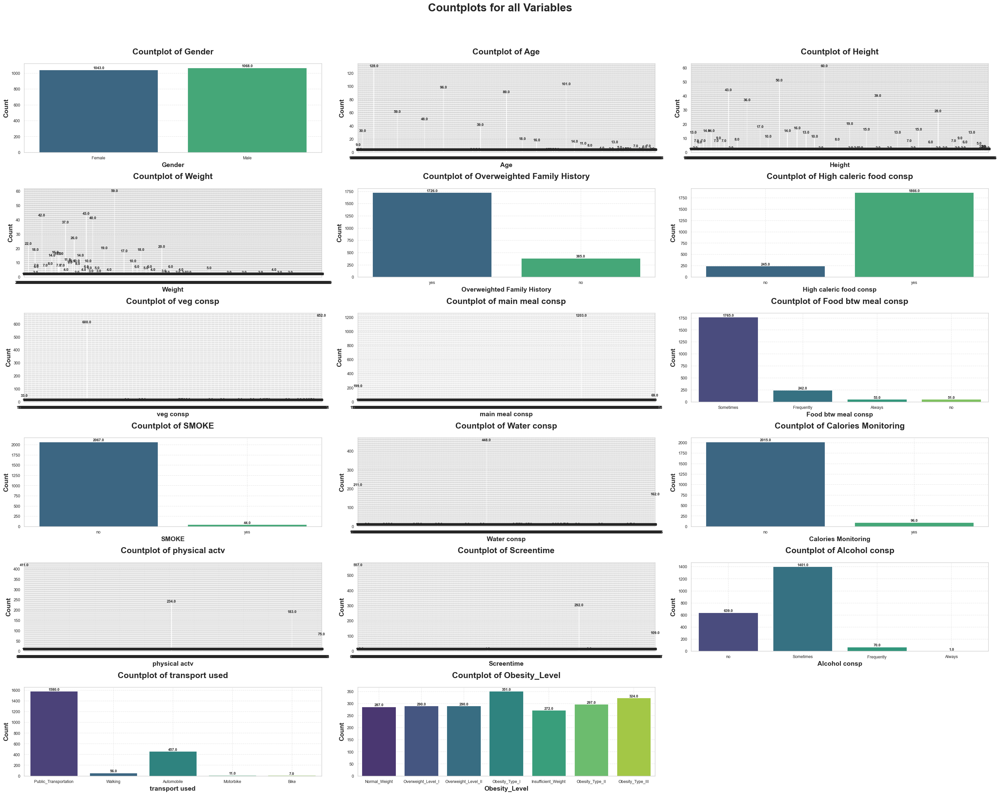

In [68]:
plt.figure(figsize=(30, 25))  
plt.suptitle('Countplots for all Variables', fontsize=24, fontweight='bold')  

# Get the list of column names from the dataframe
columns = df_train.columns

# Determine the number of rows and columns for subplots
num_rows = (len(columns) + 2) // 3  # Add 2 to round up to the nearest multiple of 3
num_cols = 3

# Create countplots for each variable
for i, col in enumerate(columns, start=1):
    ax = plt.subplot(num_rows, num_cols, i)
    sns.countplot(x=df_train[col], palette='viridis')  # Add color palette for better visualization
    ax.set_title(f'Countplot of {col}', fontsize=18, pad=20, fontweight='bold')  
    plt.xlabel(col, fontsize=14, fontweight='bold')  # Add bold fontweight to x-axis label
    plt.ylabel('Count', fontsize=14, fontweight='bold')  # Add bold fontweight to y-axis label
    plt.grid(True, linestyle='--', alpha=0.5)
     # Add count indicators on top of each bar
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height}', (p.get_x() + p.get_width() / 2., height), ha='center', va='bottom', fontsize=8, fontweight='bold')
        
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

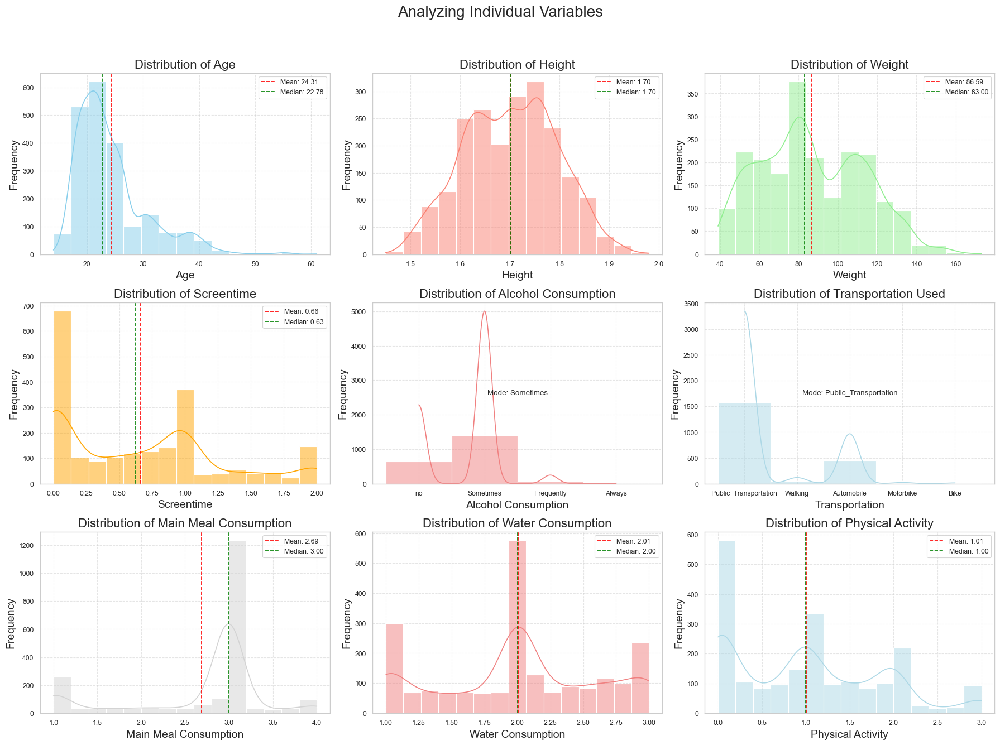

In [69]:
plt.figure(figsize=(18, 14))
plt.suptitle('Analyzing Individual Variables', fontsize=20)

# Age
plt.subplot(3, 3, 1)
sns.histplot(df_train['Age'], kde=True, bins=15, color='skyblue')
plt.title('Distribution of Age', fontsize=16)
plt.xlabel('Age', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
mean_age = df_train['Age'].mean()
median_age = df_train['Age'].median()
plt.axvline(x=mean_age, color='red', linestyle='--', label=f'Mean: {mean_age:.2f}')
plt.axvline(x=median_age, color='green', linestyle='--', label=f'Median: {median_age:.2f}')
plt.legend()

# Height
plt.subplot(3, 3, 2)
sns.histplot(df_train['Height'], kde=True, bins=15, color='salmon')
plt.title('Distribution of Height', fontsize=16)
plt.xlabel('Height', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
mean_height = df_train['Height'].mean()
median_height = df_train['Height'].median()
plt.axvline(x=mean_height, color='red', linestyle='--', label=f'Mean: {mean_height:.2f}')
plt.axvline(x=median_height, color='green', linestyle='--', label=f'Median: {median_height:.2f}')
plt.legend()

# Weight
plt.subplot(3, 3, 3)
sns.histplot(df_train['Weight'], kde=True, bins=15, color='lightgreen')
plt.title('Distribution of Weight', fontsize=16)
plt.xlabel('Weight', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
mean_weight = df_train['Weight'].mean()
median_weight = df_train['Weight'].median()
plt.axvline(x=mean_weight, color='red', linestyle='--', label=f'Mean: {mean_weight:.2f}')
plt.axvline(x=median_weight, color='green', linestyle='--', label=f'Median: {median_weight:.2f}')
plt.legend()

# Screentime
plt.subplot(3, 3, 4)
sns.histplot(df_train['Screentime'], kde=True, bins=15, color='orange')
plt.title('Distribution of Screentime', fontsize=16)
plt.xlabel('Screentime', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
mean_screentime = df_train['Screentime'].mean()
median_screentime = df_train['Screentime'].median()
plt.axvline(x=mean_screentime, color='red', linestyle='--', label=f'Mean: {mean_screentime:.2f}')
plt.axvline(x=median_screentime, color='green', linestyle='--', label=f'Median: {median_screentime:.2f}')
plt.legend()

# Alcohol consumption
plt.subplot(3, 3, 5)
sns.histplot(df_train['Alcohol consp'], kde=True, bins=15, color='lightcoral')
plt.title('Distribution of Alcohol Consumption', fontsize=16)
plt.xlabel('Alcohol Consumption', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
mode_AlcoholConsp = df_train['Alcohol consp'].mode()[0]
plt.text(0.5, 0.5, f'Mode: {mode_AlcoholConsp}', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)

# Transportation used
plt.subplot(3, 3, 6)
sns.histplot(df_train['transport used'], kde=True, bins=15, color='lightblue')
plt.title('Distribution of Transportation Used', fontsize=16)
plt.xlabel('Transportation', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
mode_transportation = df_train['transport used'].mode()[0]
plt.text(0.5, 0.5, f'Mode: {mode_transportation}', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)

# Main Meal Consumption
plt.subplot(3, 3, 7)
sns.histplot(df_train['main meal consp'], kde=True, bins=15, color='lightgrey')
plt.title('Distribution of Main Meal Consumption', fontsize=16)
plt.xlabel('Main Meal Consumption', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
mean_main_meal_consp = df_train['main meal consp'].mean()
median_main_meal_consp = df_train['main meal consp'].median()
plt.axvline(x=mean_main_meal_consp, color='red', linestyle='--', label=f'Mean: {mean_main_meal_consp:.2f}')
plt.axvline(x=median_main_meal_consp, color='green', linestyle='--', label=f'Median: {median_main_meal_consp:.2f}')
plt.legend()

# Water consumption
plt.subplot(3, 3, 8)
sns.histplot(df_train['Water consp'], kde=True, bins=15, color='lightcoral')
plt.title('Distribution of Water Consumption', fontsize=16)
plt.xlabel('Water Consumption', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
mean_water_consp = df_train['Water consp'].mean()
median_water_consp = df_train['Water consp'].median()
plt.axvline(x=mean_water_consp, color='red', linestyle='--', label=f'Mean: {mean_water_consp:.2f}')
plt.axvline(x=median_water_consp, color='green', linestyle='--', label=f'Median: {median_water_consp:.2f}')
plt.legend()

# Physical activity
plt.subplot(3, 3, 9)
sns.histplot(df_train['physical actv'], kde=True, bins=15, color='lightblue')
plt.title('Distribution of Physical Activity', fontsize=16)
plt.xlabel('Physical Activity', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
mean_physical_actv = df_train['physical actv'].mean()
median_physical_actv = df_train['physical actv'].median()
plt.axvline(x=mean_physical_actv, color='red', linestyle='--', label=f'Mean: {mean_physical_actv:.2f}')
plt.axvline(x=median_physical_actv, color='green', linestyle='--', label=f'Median: {median_physical_actv:.2f}')
plt.legend()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

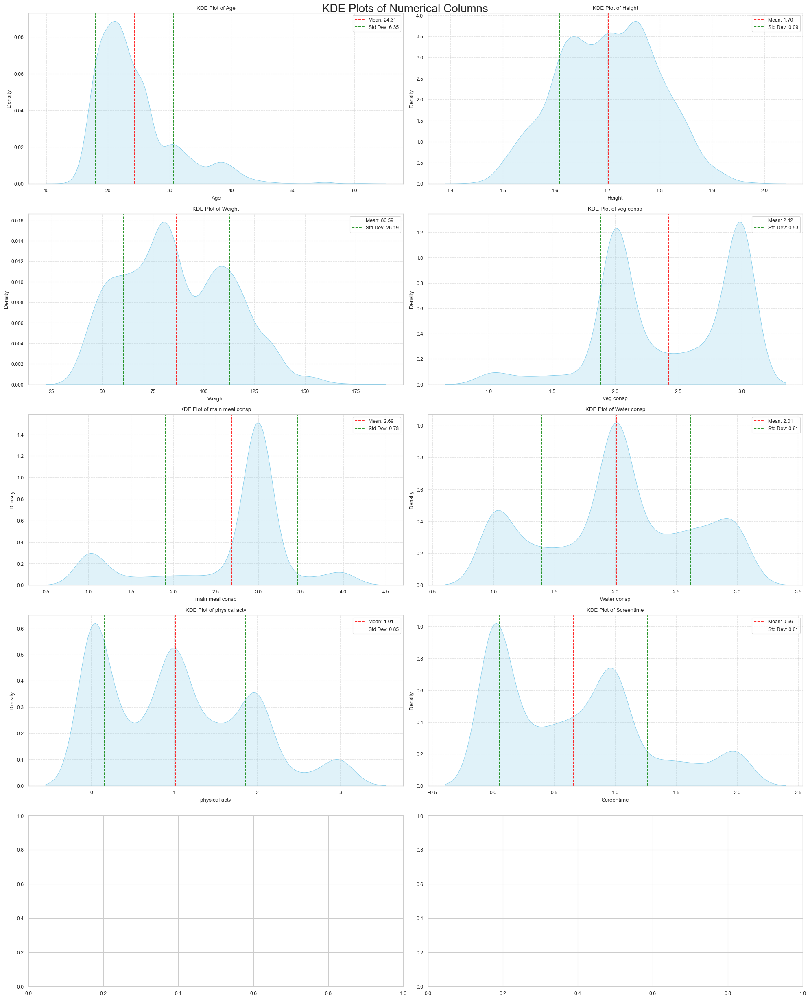

In [70]:
# Define numerical_cols
numerical_cols = df_train.select_dtypes(include=['float64', 'int64']).columns

# Function to plot KDE density for numerical columns in three plots per row
def plot_kde_density(df):
    num_plots = len(numerical_cols)
    num_rows = (num_plots + 2) // 2  # Calculate number of rows required
    
    fig, axes = plt.subplots(num_rows, 2, figsize=(20, 5*num_rows))
    fig.suptitle('KDE Plots of Numerical Columns', fontsize=20)
    
    for i, col in enumerate(numerical_cols):
        row = i // 2
        col_idx = i % 2
        ax = axes[row, col_idx]
        sns.kdeplot(data=df[col], fill=True, color='skyblue', ax=ax)
        ax.set_xlabel(col)
        ax.set_ylabel('Density')
        ax.set_title(f'KDE Plot of {col}')
        
        # Add mean and standard deviation information
        mean = df[col].mean()
        std_dev = df[col].std()
        ax.axvline(x=mean, linestyle='--', color='red', label=f'Mean: {mean:.2f}')
        ax.axvline(x=mean - std_dev, linestyle='--', color='green', label=f'Std Dev: {std_dev:.2f}')
        ax.axvline(x=mean + std_dev, linestyle='--', color='green')
        ax.legend()
        
        # Add grid lines for better visualization
        ax.grid(True, linestyle='--', alpha=0.5)
    
    plt.tight_layout()
    plt.show()

# Call the function to plot KDE density for numerical columns in df_train
plot_kde_density(df_train)

In [71]:
def plot_data(df):
    """
    Plot different types of plots for each categorical column in the DataFrame.

    Parameters:
        df (DataFrame): The input DataFrame containing categorical columns.
    
    Returns:
        None
    """
    # Selecting categorical columns
    categorical_cols = df.select_dtypes(include=['object']).columns
    
    # Create subplots
    fig, axes = plt.subplots(len(categorical_cols), 2, figsize=(14, 7*len(categorical_cols)))
    
    # Plotting pie chart for each categorical variable in the first column
    for i, col in enumerate(categorical_cols):
        ax = axes[i, 0]
        value_counts = df[col].value_counts()
        ax.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=90)
        ax.set_title(f'Distribution of {col}')
        ax.set_ylabel('')
        ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
        ax.annotate(f'Total Count: {len(df[col])}', xy=(0, 0), fontsize=10, ha="center")
    
    # Plotting bar plot for each categorical variable in the second column
    for i, col in enumerate(categorical_cols):
        ax = axes[i, 1]
        value_counts = df[col].value_counts()
        sns.barplot(x=value_counts.index, y=value_counts, ax=ax)
        ax.set_title(f'Count of {col}')
        ax.set_xlabel(f'{col}')
        ax.set_ylabel('Count')
        ax.tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability
        for patch in ax.patches:
            ax.annotate(f'{patch.get_height()}', (patch.get_x() + patch.get_width() / 2., patch.get_height()), 
                        ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), 
                        textcoords='offset points')
    
    plt.tight_layout()
    plt.show()

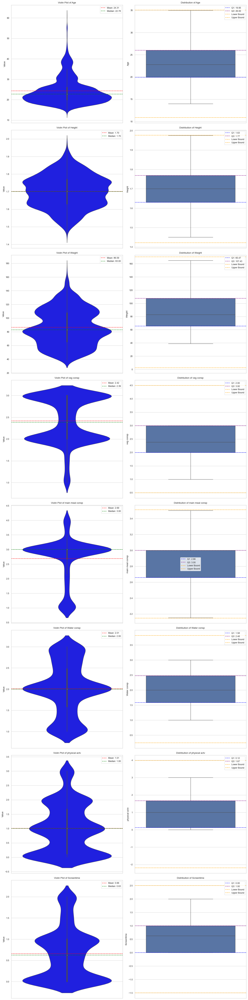

In [72]:
def plot_data(df):
    """
    Plot different types of plots for each column in the DataFrame.

    Parameters:
        df (DataFrame): The input DataFrame.

    Returns:
        None
    """
    numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
    
    # Create subplots
    fig, axes = plt.subplots(len(numerical_cols), 2, figsize=(14, 7*len(numerical_cols)))
    
    # Plotting violin plot for each numerical variable in the first column
    for i, col in enumerate(numerical_cols):
        ax = axes[i, 0]
        sns.violinplot(data=df[col], ax=ax, color='blue')
        ax.set_title(f'Violin Plot of {col}')
        ax.set_xlabel('')
        ax.set_ylabel('Value')
        # Add statistical information
        mean = df[col].mean()
        median = df[col].median()
        ax.axhline(y=mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
        ax.axhline(y=median, color='green', linestyle='--', label=f'Median: {median:.2f}')
        ax.legend()
    
    # Plotting box plot for each numerical variable in the second column
    for i, col in enumerate(numerical_cols):
        ax = axes[i, 1]
        sns.boxplot(data=df, y=col, ax=ax, showfliers=False)
        ax.set_title(f'Distribution of {col}')
        ax.set_ylabel(f'{col}')
        ax.set_xlabel('')  # Remove x-axis label as it represents 'Level' which is not available
        # Add statistical information
        q1 = df[col].quantile(0.25)
        q3 = df[col].quantile(0.75)
        iqr = q3 - q1
        ax.axhline(y=q1, color='blue', linestyle='--', label=f'Q1: {q1:.2f}')
        ax.axhline(y=q3, color='purple', linestyle='--', label=f'Q3: {q3:.2f}')
        ax.axhline(y=q1 - 1.5 * iqr, color='orange', linestyle='--', label=f'Lower Bound')
        ax.axhline(y=q3 + 1.5 * iqr, color='orange', linestyle='--', label=f'Upper Bound')
        ax.legend()
    
    plt.tight_layout()
    plt.show()

# Call the function to plot different types of plots for df_train
plot_data(df_train)

In [73]:
def plot_scatter_relationship(col1, col2, target=None, data=None):
    plt.figure(figsize=(10, 12))
    
    # Plotting the scatter plot
    sns.scatterplot(data=data, x=col1, y=col2, hue=target, palette='viridis', alpha=0.5)
    
    # Calculating correlation coefficient
    corr_coef, _ = pearsonr(data[col1], data[col2])
    
    # Adding regression lines
    sns.regplot(data=data, x=col1, y=col2, scatter=False, color='black')
    
    # Adding statistical summary
    plt.text(data[col1].min(), data[col2].max(), f'Correlation coefficient: {corr_coef:.2f}', fontsize=10)
    plt.text(data[col1].min(), data[col2].max() - 0.03 * (data[col2].max() - data[col2].min()), f'Mean {col1}: {data[col1].mean():.2f}', fontsize=10)
    plt.text(data[col1].min(), data[col2].max() - 0.06 * (data[col2].max() - data[col2].min()), f'Mean {col2}: {data[col2].mean():.2f}', fontsize=10)
    plt.text(data[col1].min(), data[col2].max() - 0.09 * (data[col2].max() - data[col2].min()), f'Std {col1}: {data[col1].std():.2f}', fontsize=10)
    plt.text(data[col1].min(), data[col2].max() - 0.12* (data[col2].max() - data[col2].min()), f'Std {col2}: {data[col2].std():.2f}', fontsize=10)
    
    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.title(f'Scatter Plot: {col1} vs {col2} with {target}')
    plt.grid(True)
    plt.legend()
    plt.show()

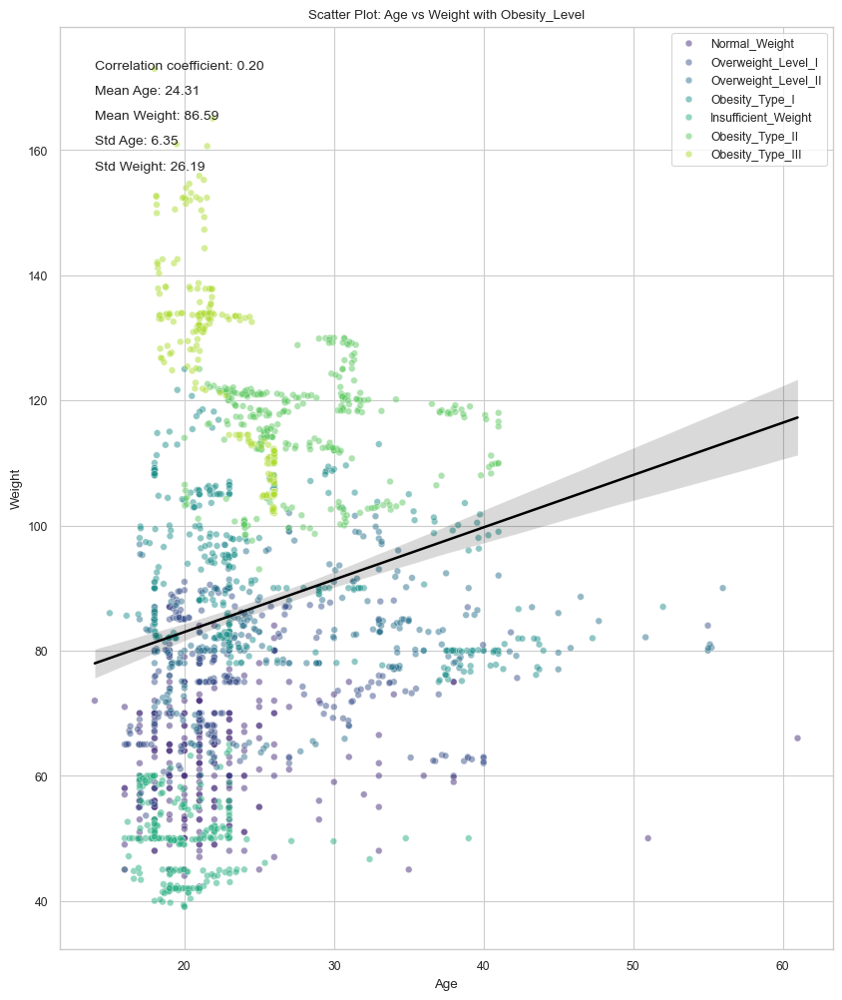

In [74]:
plot_scatter_relationship('Age','Weight','Obesity_Level', df_train)

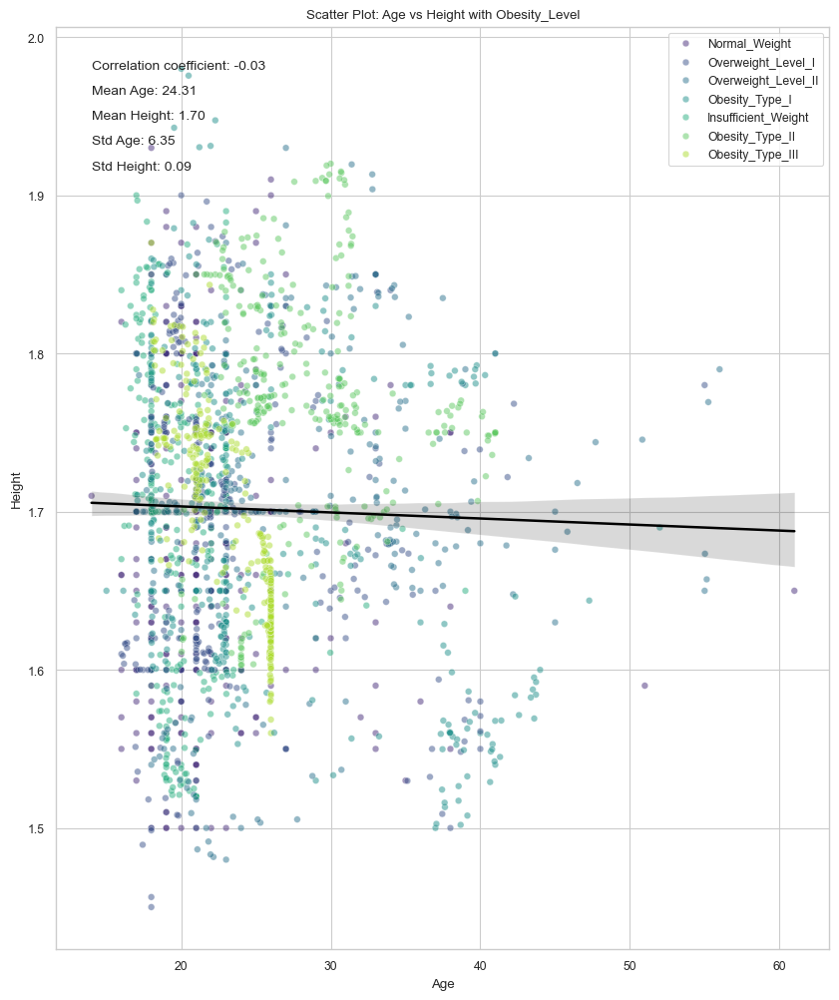

In [75]:
plot_scatter_relationship('Age','Height','Obesity_Level',df_train)

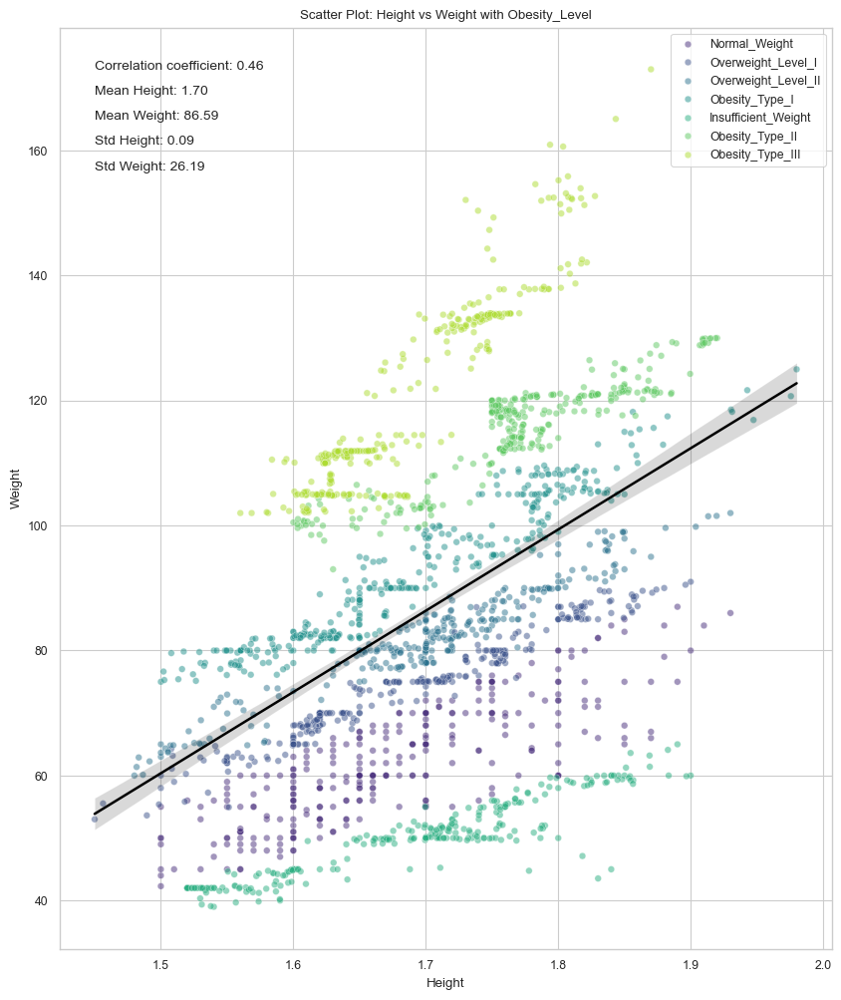

In [76]:
plot_scatter_relationship('Height','Weight','Obesity_Level',df_train)

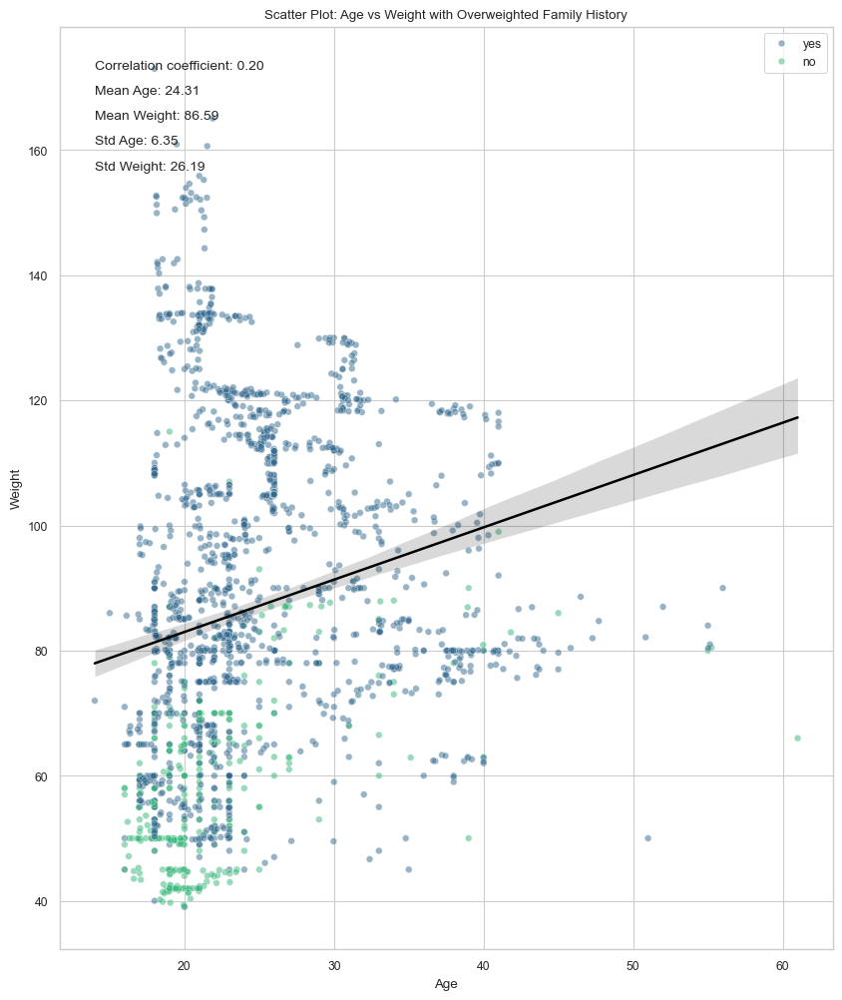

In [77]:
plot_scatter_relationship('Age','Weight','Overweighted Family History',df_train)

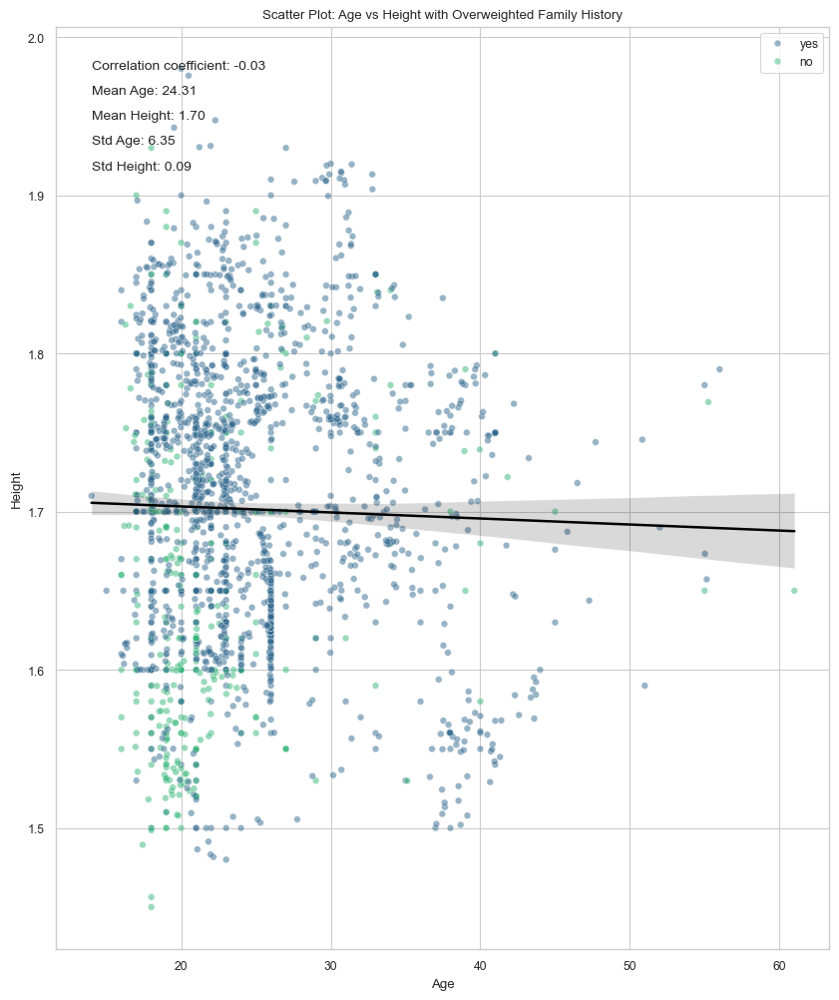

In [78]:
plot_scatter_relationship('Age','Height','Overweighted Family History',df_train)

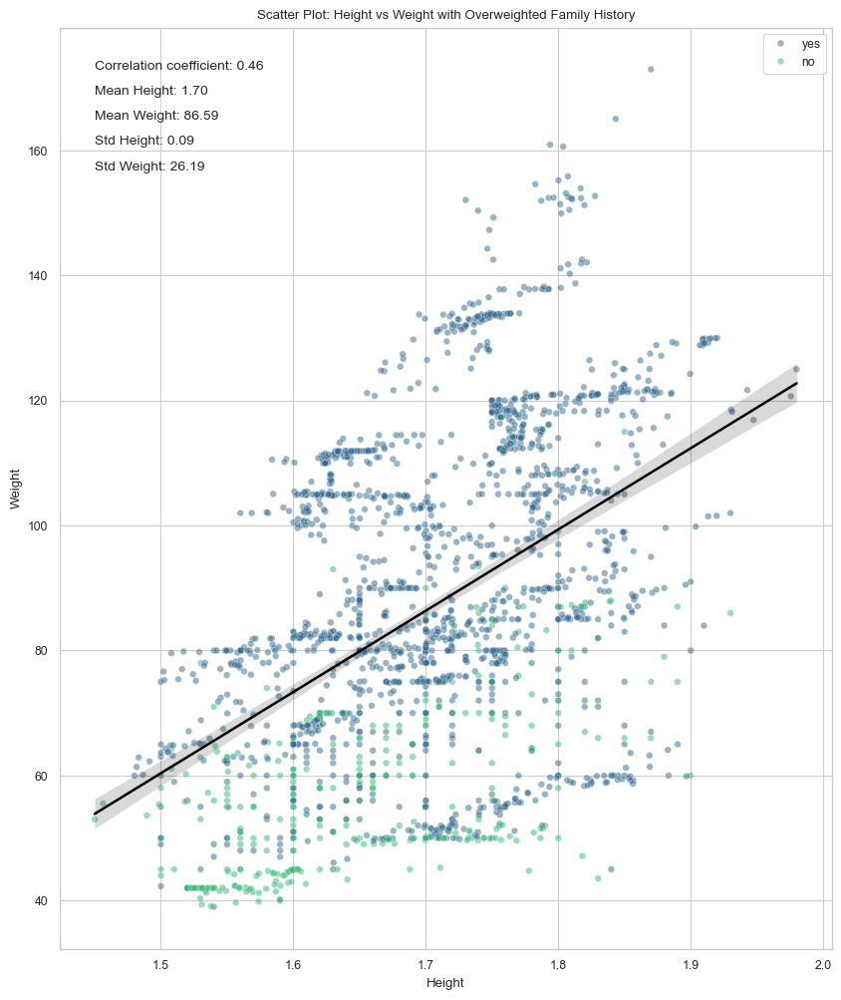

In [79]:
plot_scatter_relationship('Height','Weight','Overweighted Family History',df_train)

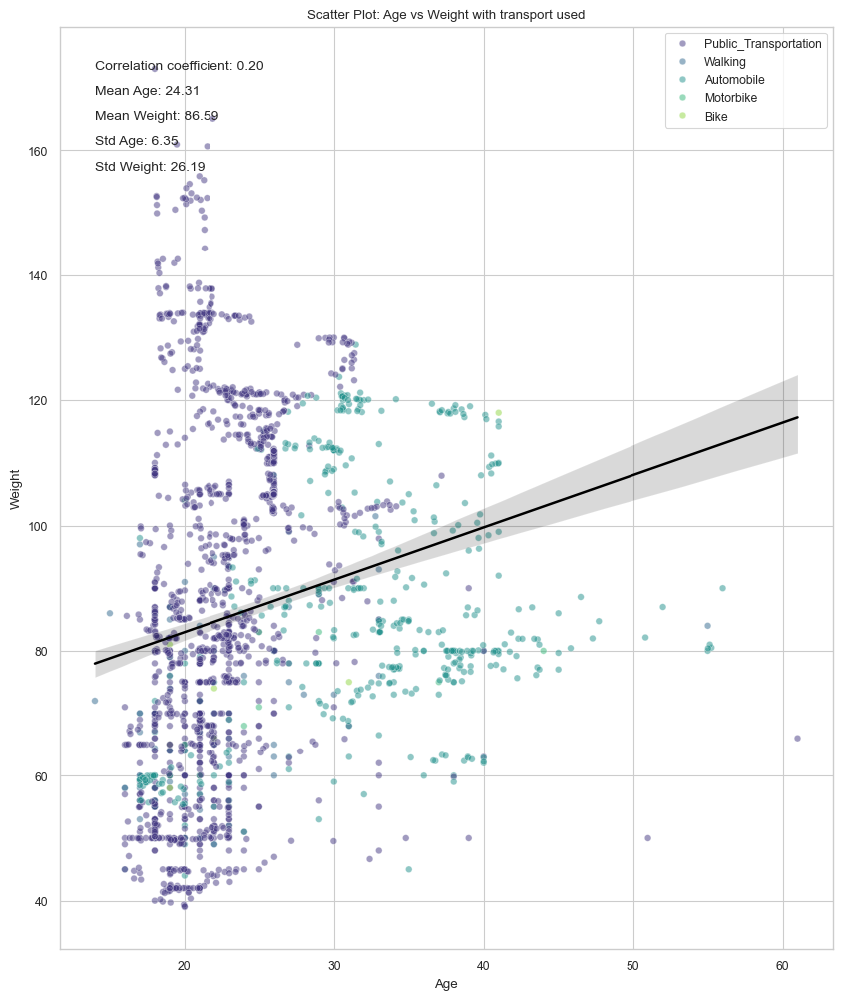

In [80]:
plot_scatter_relationship('Age','Weight','transport used',df_train)

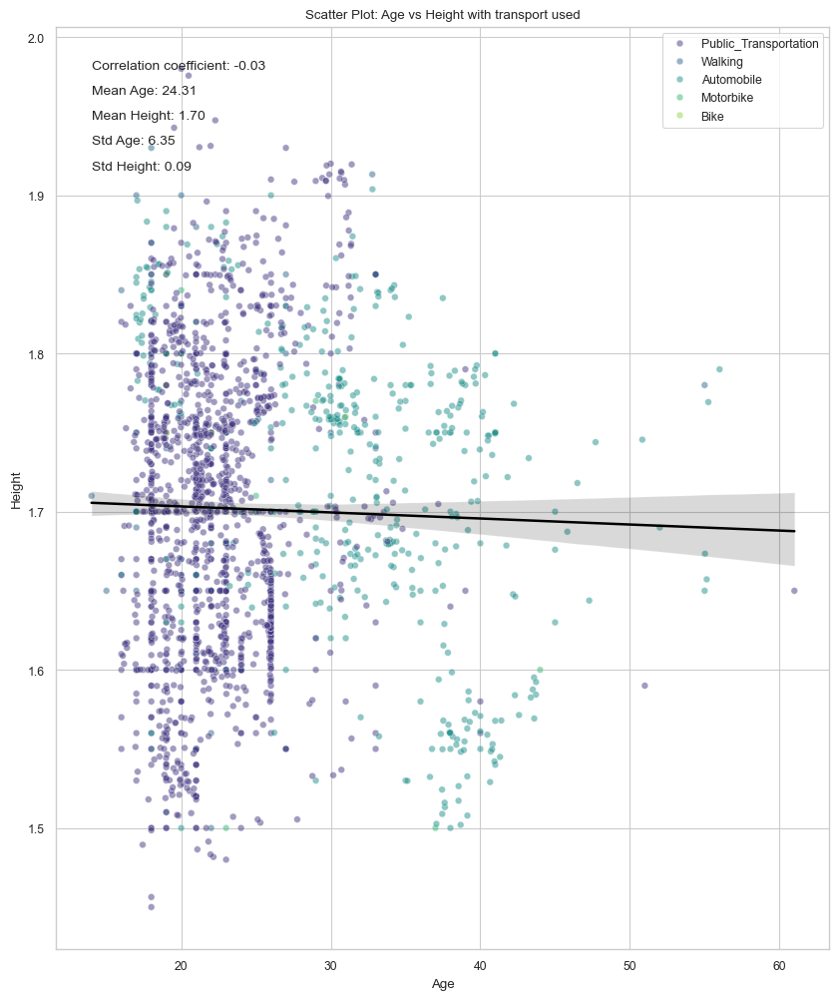

In [81]:
plot_scatter_relationship('Age','Height','transport used',df_train)

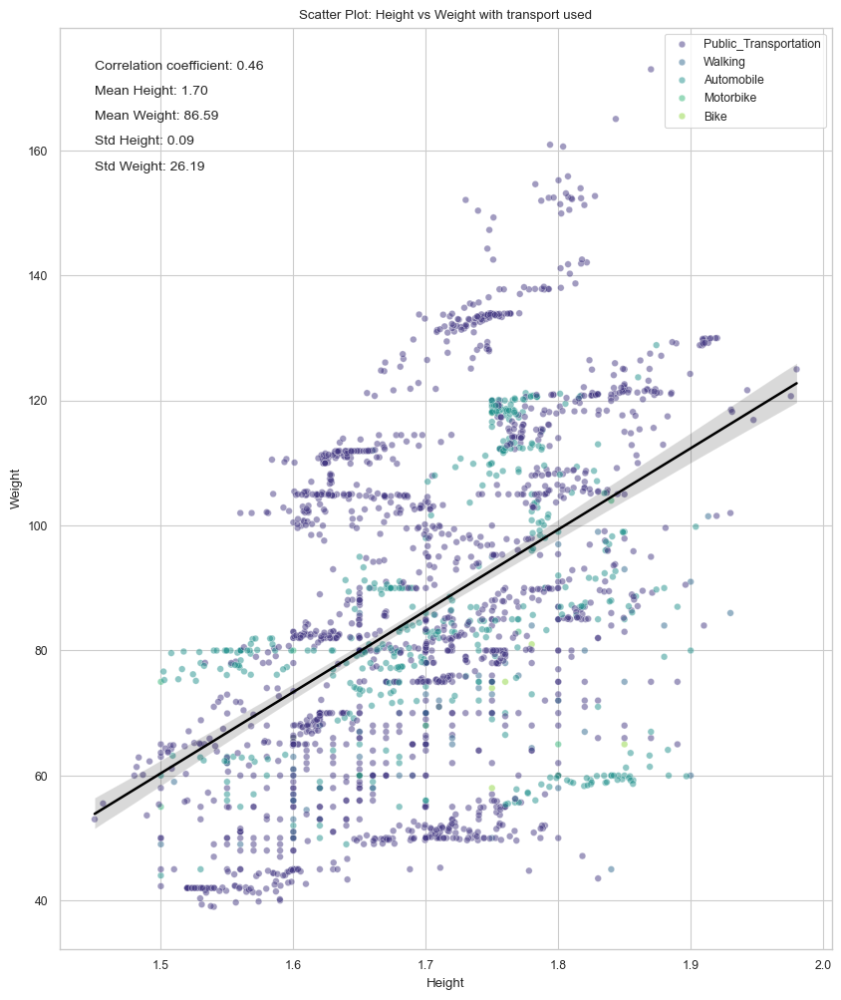

In [82]:
plot_scatter_relationship('Height','Weight','transport used',df_train)

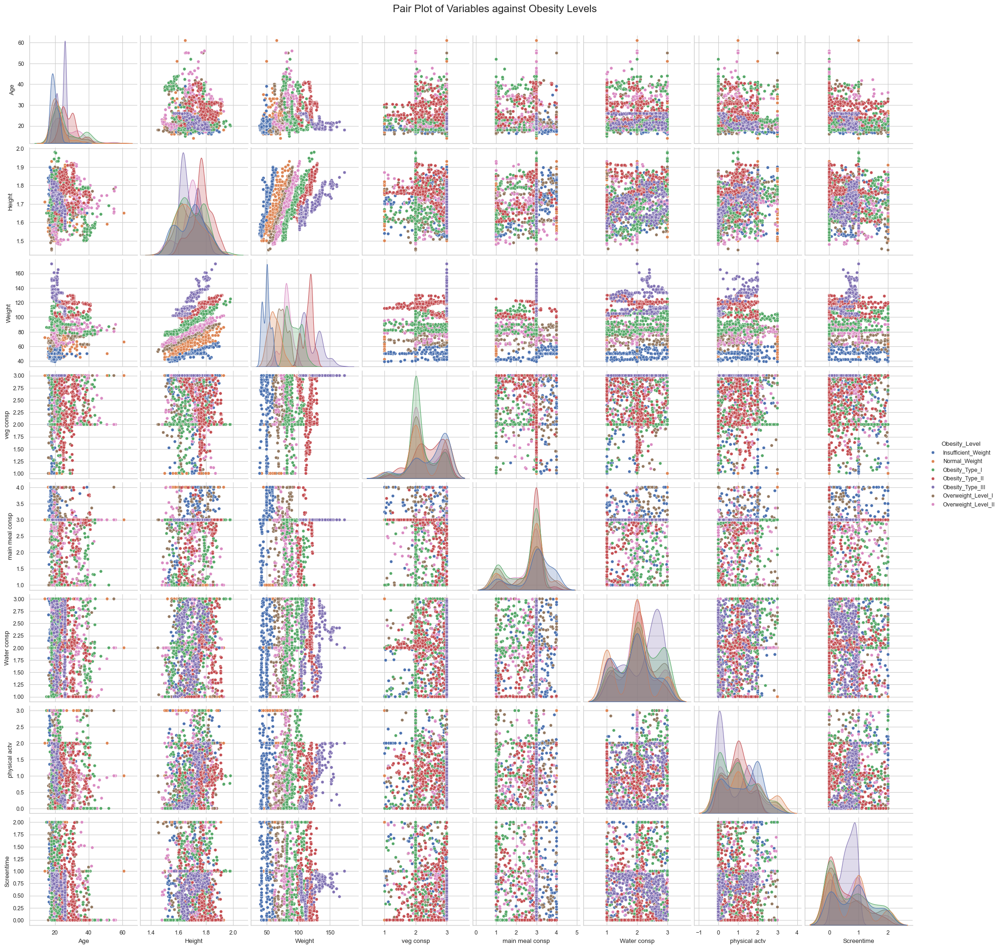

In [83]:
# Selecting numerical columns for pairplot
numerical_columns = ['Age', 'Height', 'Weight', 'High caleric food consp', 'veg consp', 'main meal consp',
                     'Food btw meal consp', 'Water consp', 'Calories Monitoring', 'physical actv', 'Screentime', 
                     'Alcohol consp']

# Add the target variable 'Obesity_Level' for hue
df_train['Obesity_Level'] = df_train['Obesity_Level'].astype('category')

# Create pair plot
pair_plot = sns.pairplot(df_train[numerical_columns + ['Obesity_Level']], hue='Obesity_Level', palette='deep', diag_kind='kde')

# Add title to the plot
pair_plot.fig.suptitle('Pair Plot of Variables against Obesity Levels', fontsize=16, y=1.02)

# Display the plot
plt.show()


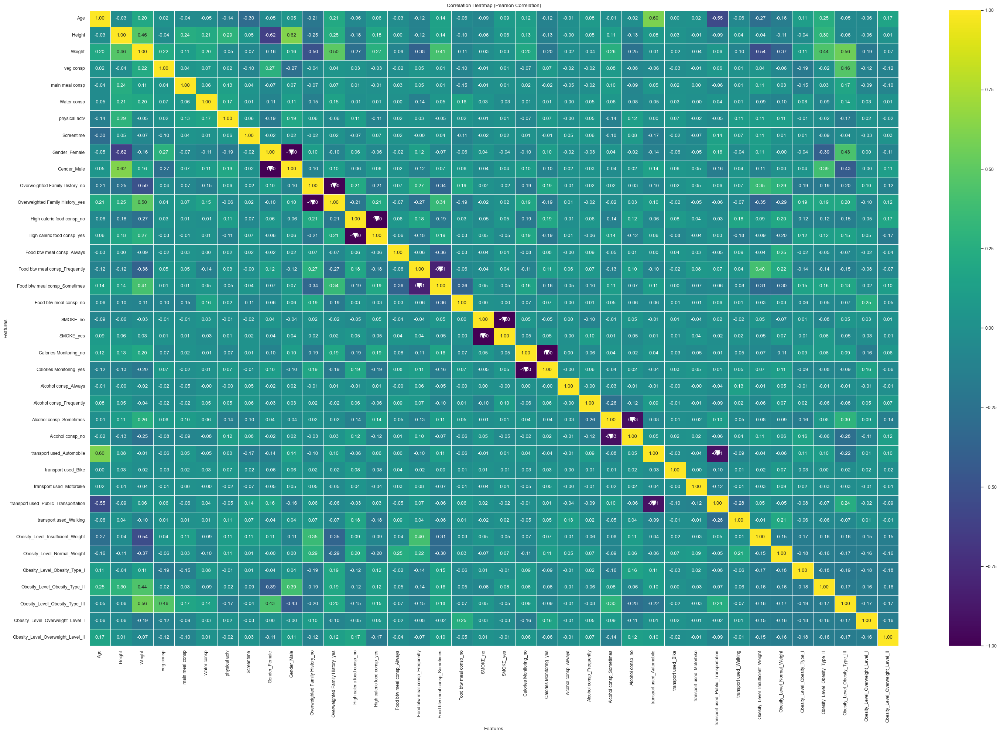

In [84]:
def plot_correlation_heatmap(df, method='pearson'):
    # Calculate the correlation matrix
    corr_matrix = df.corr(method=method)
    
    # Plot the heatmap
    plt.figure(figsize=(30, 20))
    sns.heatmap(corr_matrix, annot=True, cmap='viridis', fmt=".2f", linewidths=.5, cbar=True)

    # Add indicators for strength and direction of correlation
    for i in range(len(corr_matrix)):
        for j in range(len(corr_matrix.columns)):
            if i != j:
                if corr_matrix.iloc[i, j] >= 0.7:
                    plt.text(j + 0.5, i + 0.5, '\u25B2', ha='center', va='center', color='white', fontsize=15)
                elif corr_matrix.iloc[i, j] <= -0.7:
                    plt.text(j + 0.5, i + 0.5, '\u25BC', ha='center', va='center', color='white', fontsize=15)

    # Set labels and title
    plt.title(f'Correlation Heatmap ({method.capitalize()} Correlation)')
    plt.xlabel('Features')
    plt.ylabel('Features')
    
    # Adjust layout
    plt.tight_layout()

    # Show plot
    plt.show()

# Perform one-hot encoding for categorical variables
df_train_encoded = pd.get_dummies(df_train)

# Plot correlation heatmap for Pearson ,spearman and kendell correlation coefficient(in my case using kendell's tau)
plot_correlation_heatmap(df_train_encoded, method='pearson')

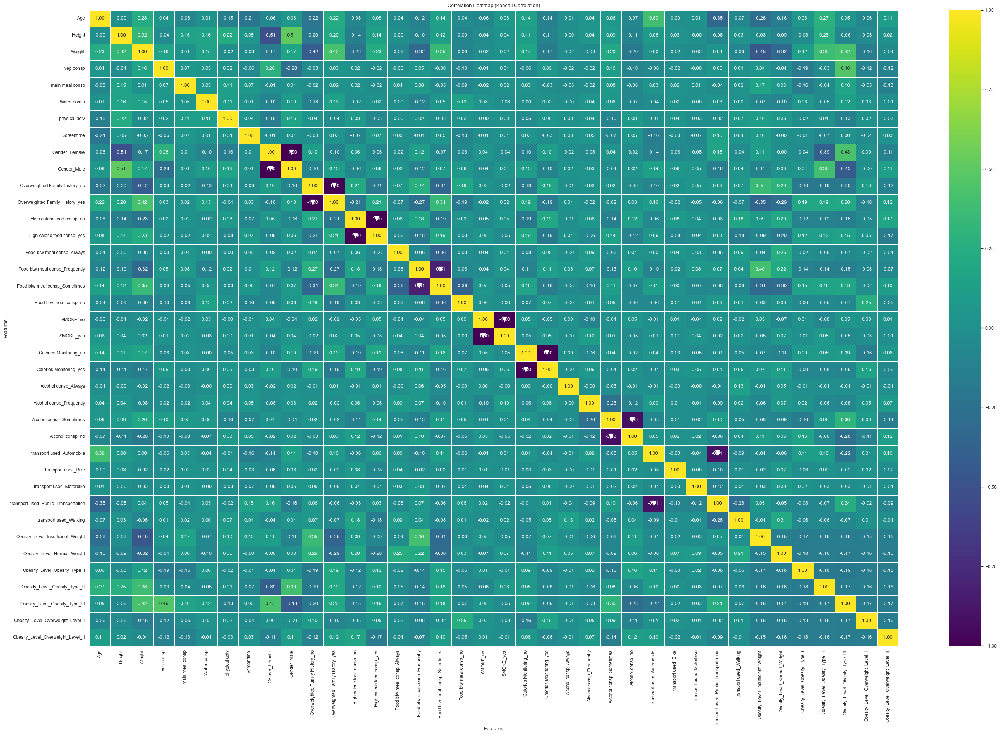

In [85]:
# Plot correlation heatmap for Kendall's tau correlation coefficient
plot_correlation_heatmap(df_train_encoded, method='kendall')

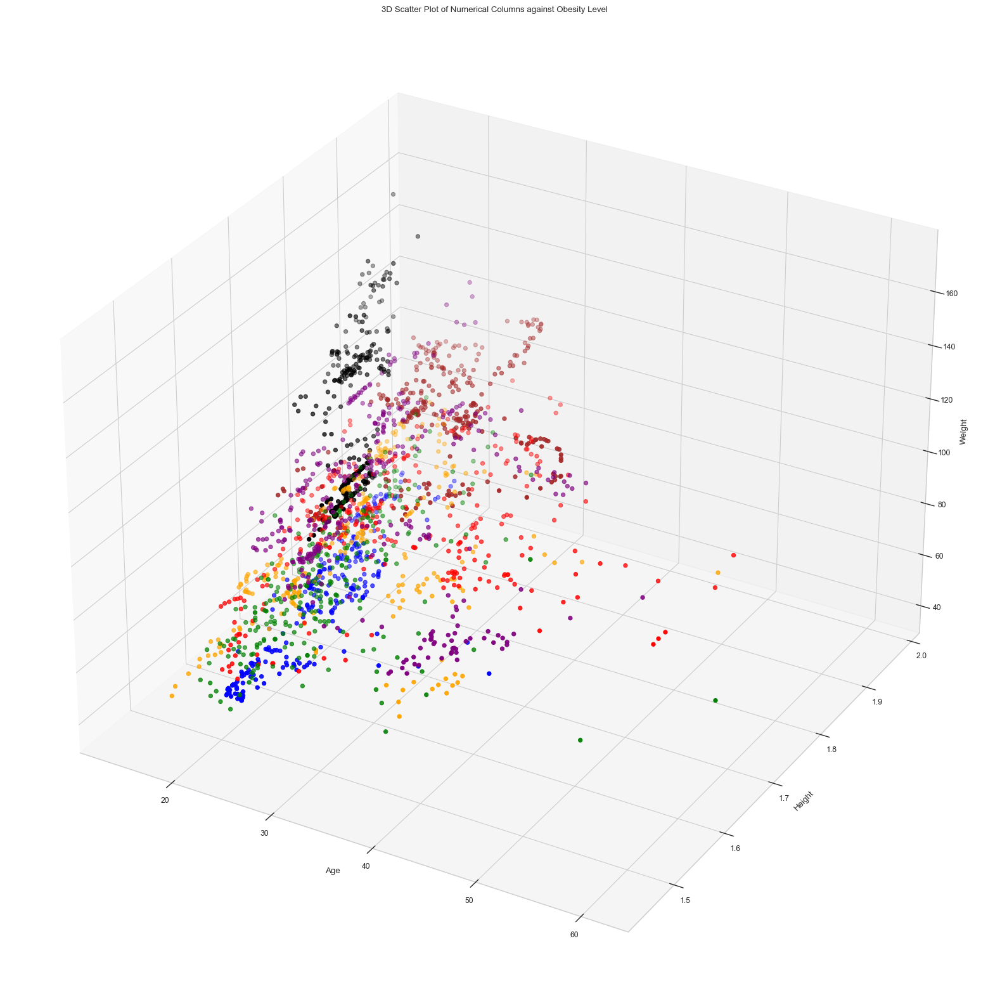

In [86]:
# Define numerical columns for the plot
numerical_columns = ['Age', 'Height', 'Weight', 'High caleric food consp', 'veg consp', 'main meal consp',
                     'Food btw meal consp', 'Water consp', 'Calories Monitoring', 'physical actv', 'Screentime', 
                     'Alcohol consp']

# Selecting only the numerical columns and 'Obesity_Level' from the dataframe
df_numerical = df_train[numerical_columns + ['Obesity_Level']]

# Define colors for different obesity levels
color_map = {'Insufficient_Weight': 'blue', 
             'Normal_Weight': 'green', 
             'Overweight_Level_I': 'orange', 
             'Overweight_Level_II': 'red', 
             'Obesity_Type_I': 'purple', 
             'Obesity_Type_II': 'brown', 
             'Obesity_Type_III': 'black'}

# Create a 3D scatter plot
fig = plt.figure(figsize=(30,20))
ax = fig.add_subplot(111, projection='3d')

# Plot each obesity level separately
for obesity_level, color in color_map.items():
    df_obesity_level = df_numerical[df_numerical['Obesity_Level'] == obesity_level]
    ax.scatter(df_obesity_level['Age'], df_obesity_level['Height'], df_obesity_level['Weight'], color=color, label=obesity_level)

# Set labels and title
ax.set_xlabel('Age')
ax.set_ylabel('Height')
ax.set_zlabel('Weight')
ax.set_title('3D Scatter Plot of Numerical Columns against Obesity Level')

# Show plot
plt.show()

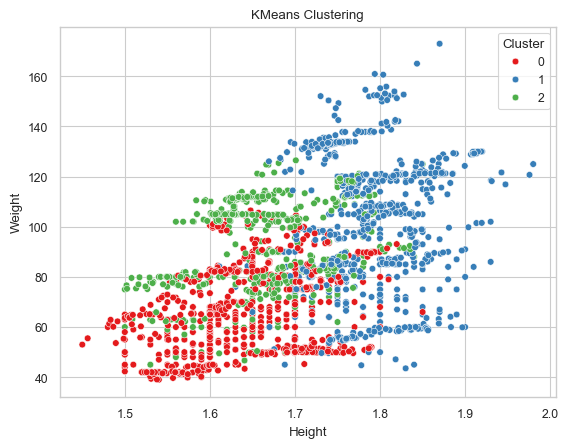

Obesity_Level  Insufficient_Weight  Normal_Weight  Obesity_Type_I  \
Cluster                                                             
0                         0.241423       0.235070        0.152478   
1                         0.097187       0.092072        0.177749   
2                         0.011070       0.055351        0.169742   

Obesity_Level  Obesity_Type_II  Obesity_Type_III  Overweight_Level_I  \
Cluster                                                                
0                     0.030496          0.000000            0.188056   
1                     0.230179          0.177749            0.120205   
2                     0.171587          0.341328            0.088561   

Obesity_Level  Overweight_Level_II  
Cluster                             
0                         0.152478  
1                         0.104859  
2                         0.162362  


In [87]:
# Select numerical features for clustering
numerical_features = ['Age', 'Height', 'Weight', 'veg consp', 'main meal consp', 'Water consp', 'physical actv', 'Screentime']

# Extract numerical features from the dataframe
X = df_train[numerical_features]

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize and fit KMeans model
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X_scaled)

# Add cluster labels to the dataframe
df_train['Cluster'] = kmeans.labels_

# Visualize the clusters (assuming 2D visualization)
sns.scatterplot(x='Height', y='Weight', hue='Cluster', data=df_train, palette='Set1')
plt.title('KMeans Clustering')
plt.show()

# Analyze how clusters relate to obesity levels
cluster_obesity = df_train.groupby('Cluster')['Obesity_Level'].value_counts(normalize=True).unstack()
print(cluster_obesity)

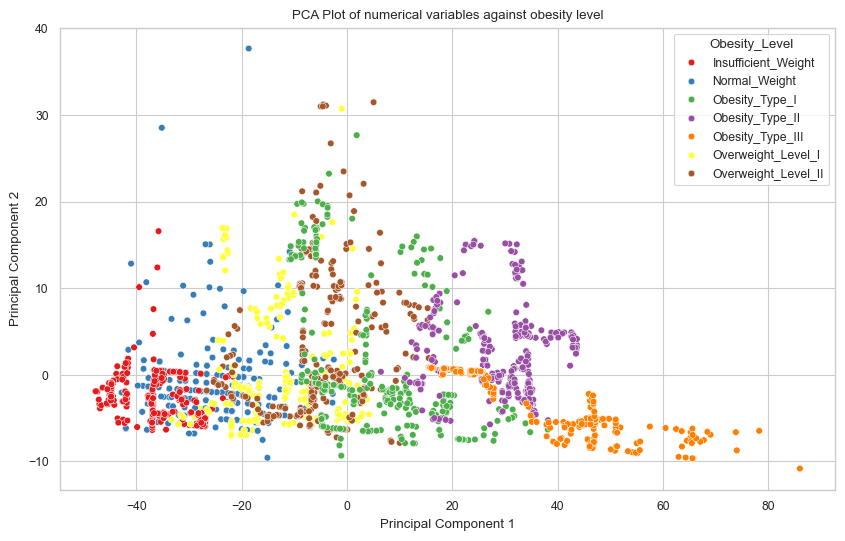

In [88]:
# Assuming you have numerical columns in df_train
# Select numerical columns for PCA
numerical_columns = ['Age', 'Height', 'Weight', 'veg consp', 'main meal consp', 'Water consp', 'physical actv', 'Screentime']

# Extract numerical data
X = df_train[numerical_columns]

# Perform PCA
pca = PCA(n_components=2)  # You can adjust the number of components
X_pca = pca.fit_transform(X)

# Create a DataFrame for the PCA results
df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])

# Add Obesity_Level to the PCA DataFrame for color differentiation
df_pca['Obesity_Level'] = df_train['Obesity_Level']

# Visualize PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Obesity_Level', data=df_pca, palette='Set1', legend='full')
plt.title('PCA Plot of numerical variables against obesity level')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

Column: Age


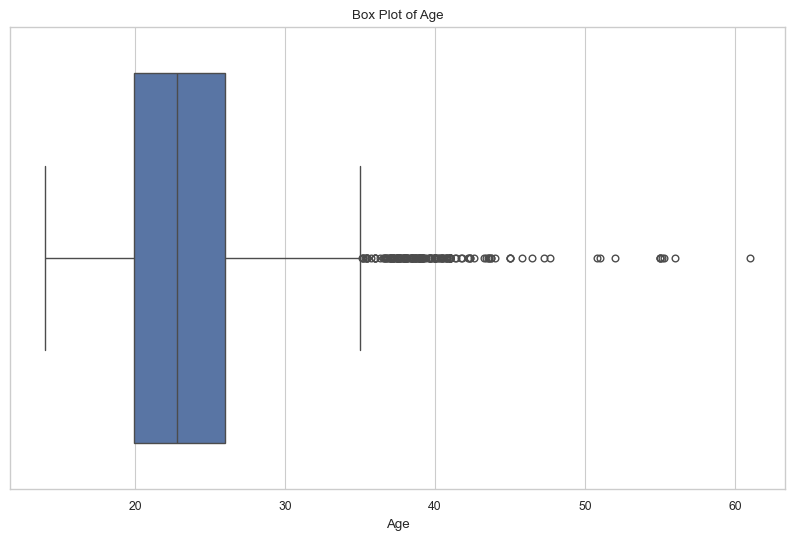



Column: Height


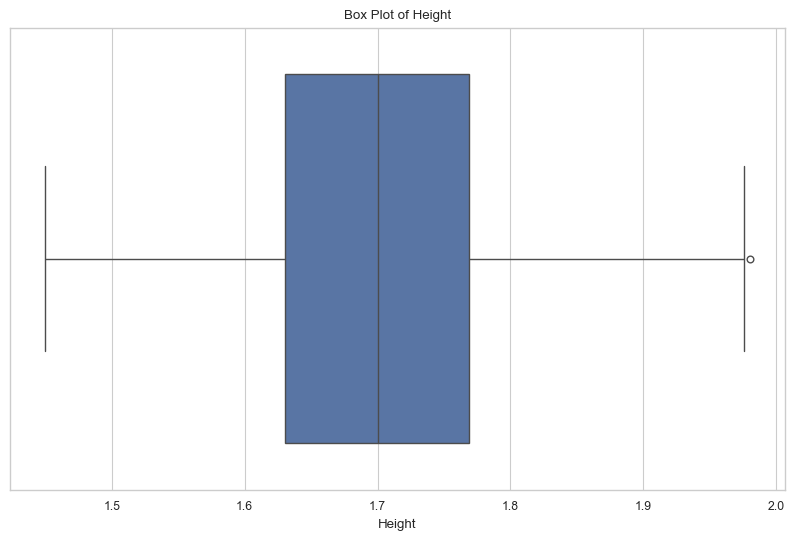



Column: Weight


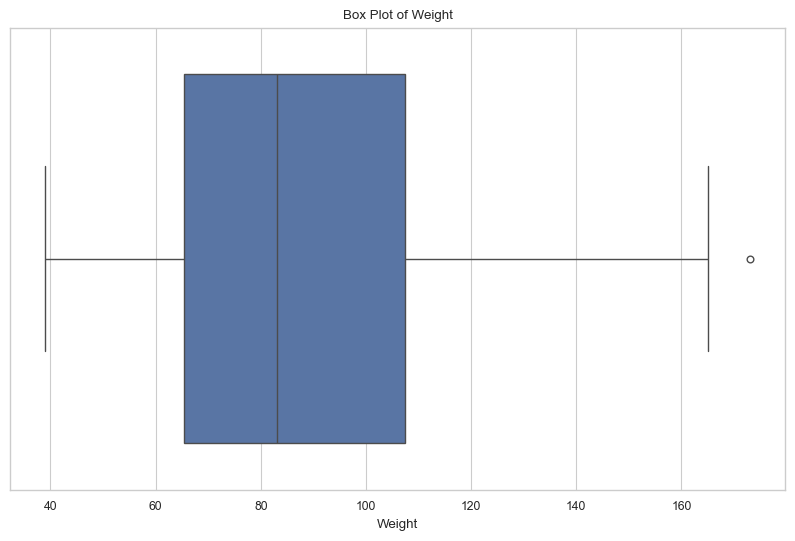



Column: veg consp


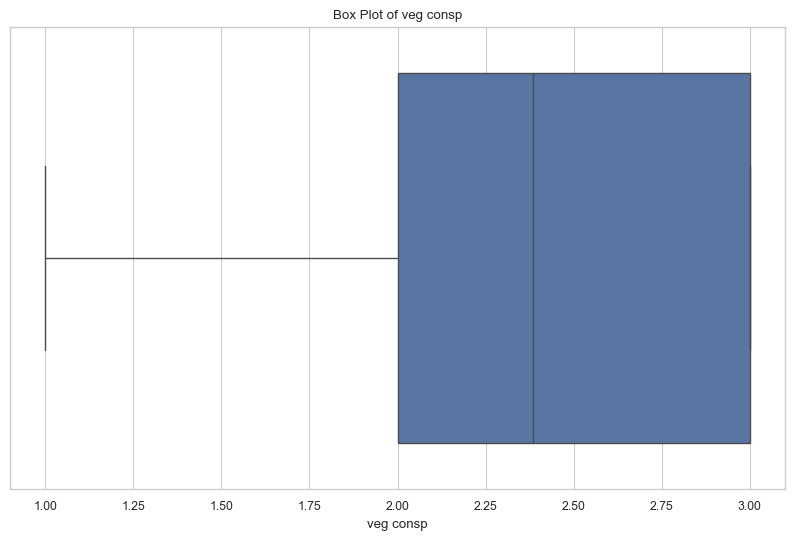



Column: main meal consp


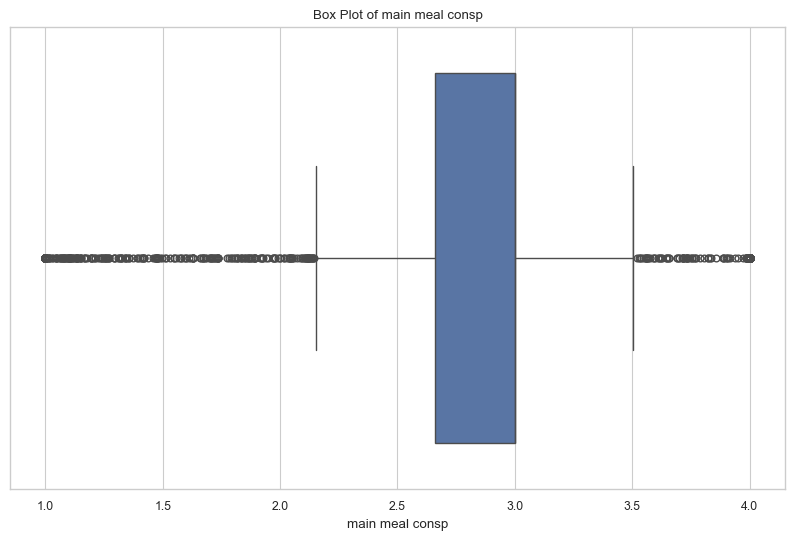



Column: Water consp


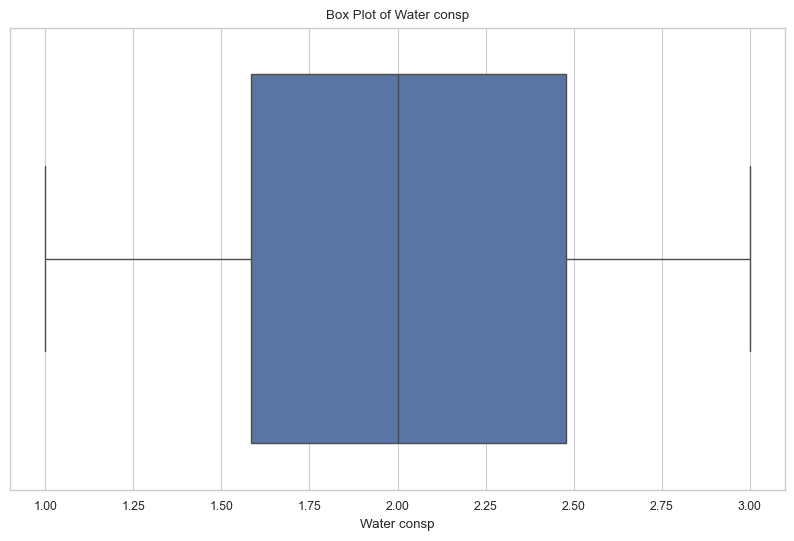



Column: physical actv


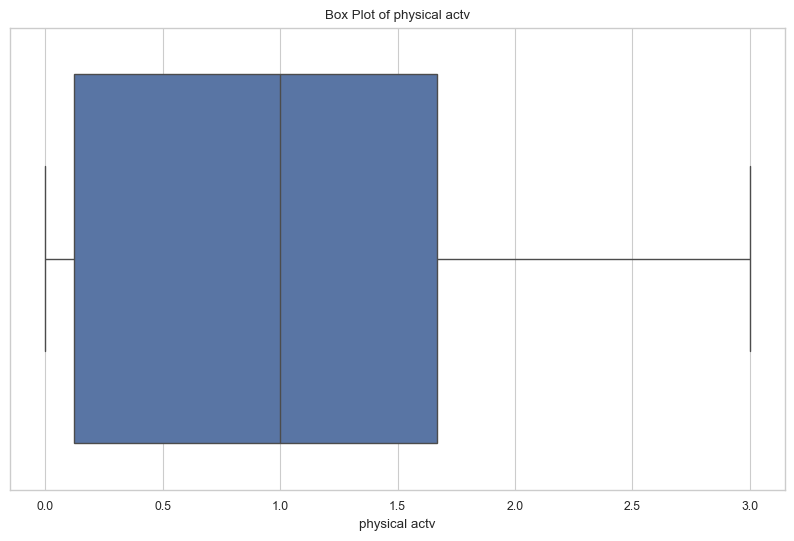



Column: Screentime


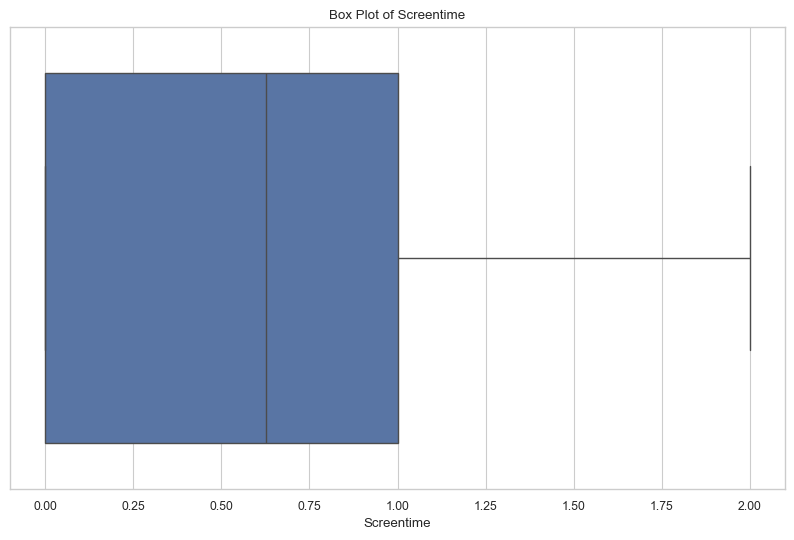



Column: Cluster


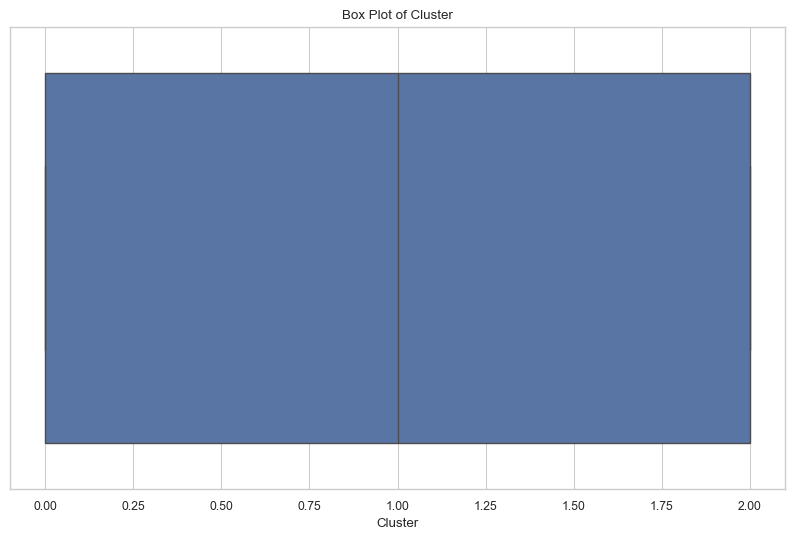

In [89]:
# Function to identify outliers using Box Plot
def box_plot_outliers(df, col):
    """
    Detect outliers using Box Plot.

    Parameters:
        df (DataFrame): The input DataFrame.
        col (str): The name of the column to analyze.

    Returns:
        None
    """
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df[col])
    plt.title(f'Box Plot of {col}')
    plt.xlabel(f'{col}')
    plt.show()
    
# Selecting numerical columns
numerical_cols = df_train.select_dtypes(include=['float64', 'int32']).columns

# Loop through each numerical column and perform outlier analysis
for col in numerical_cols:
    print(f'Column: {col}')
    box_plot_outliers(df_train, col)
    print('\n')

In [90]:
# Function to identify outliers using Z-Score
def z_score_outliers(df, col, threshold=3):
    """
    Detect outliers using Z-Score.

    Parameters:
        df (DataFrame): The input DataFrame.
        col (str): The name of the column to analyze.
        threshold (float): The Z-Score threshold for outlier detection.

    Returns:
        None
    """
    z_scores = (df[col] - df[col].mean()) / df[col].std()
    outliers = df[abs(z_scores) > threshold]
    print(f'Number of outliers detected using Z-Score for {col}: {outliers.shape[0]}')
    
# Selecting numerical columns
numerical_cols = df_train.select_dtypes(include=['float64', 'int32']).columns

# Loop through each numerical column and perform outlier analysis
for col in numerical_cols:
    print(f'Column: {col}')
    z_score_outliers(df_train, col)
    print('\n')

Column: Age
Number of outliers detected using Z-Score for Age: 24


Column: Height
Number of outliers detected using Z-Score for Height: 0


Column: Weight
Number of outliers detected using Z-Score for Weight: 1


Column: veg consp
Number of outliers detected using Z-Score for veg consp: 0


Column: main meal consp
Number of outliers detected using Z-Score for main meal consp: 0


Column: Water consp
Number of outliers detected using Z-Score for Water consp: 0


Column: physical actv
Number of outliers detected using Z-Score for physical actv: 0


Column: Screentime
Number of outliers detected using Z-Score for Screentime: 0


Column: Cluster
Number of outliers detected using Z-Score for Cluster: 0




In [91]:
# Function to identify outliers using IQR
def iqr_outliers(df, col):
    """
    Detect outliers using Interquartile Range (IQR).

    Parameters:
        df (DataFrame): The input DataFrame.
        col (str): The name of the column to analyze.

    Returns:
        None
    """
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    print(f'Number of outliers detected using IQR for {col}: {outliers.shape[0]}')
    
# Selecting numerical columns
numerical_cols = df_train.select_dtypes(include=['float64', 'int32']).columns

# Loop through each numerical column and perform outlier analysis
for col in numerical_cols:
    print(f'Column: {col}')
    iqr_outliers(df_train, col)
    print('\n')

Column: Age
Number of outliers detected using IQR for Age: 168


Column: Height
Number of outliers detected using IQR for Height: 1


Column: Weight
Number of outliers detected using IQR for Weight: 1


Column: veg consp
Number of outliers detected using IQR for veg consp: 0


Column: main meal consp
Number of outliers detected using IQR for main meal consp: 579


Column: Water consp
Number of outliers detected using IQR for Water consp: 0


Column: physical actv
Number of outliers detected using IQR for physical actv: 0


Column: Screentime
Number of outliers detected using IQR for Screentime: 0


Column: Cluster
Number of outliers detected using IQR for Cluster: 0




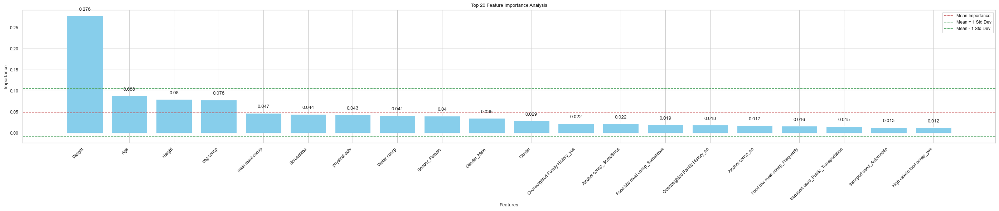

Statistical Term                               Value
-------------------------------------------  -------
Mean Importance                                0.048
Standard Deviation of Importance               0.057
Coefficient of Variation (CV) of Importance    1.195


In [92]:
# Assuming df_train contains your dataset
# Define X (features) and y (target variable)
X = df_train.drop(columns=['Obesity_Level'])
y = df_train['Obesity_Level']

# Perform one-hot encoding for categorical variables
X_encoded = pd.get_dummies(X)

# Initialize the model
model = RandomForestClassifier()

# Train the model
model.fit(X_encoded, y)

# Get feature importances
feature_importances = model.feature_importances_

# Sort feature importances and corresponding feature names
sorted_indices = feature_importances.argsort()[::-1]
sorted_feature_importances = feature_importances[sorted_indices]
sorted_feature_names = X_encoded.columns[sorted_indices]

# Limit the number of displayed features
top_n = 20
sorted_feature_importances = sorted_feature_importances[:top_n]
sorted_feature_names = sorted_feature_names[:top_n]
# Calculate mean and standard deviation of feature importances
mean_importance = np.mean(sorted_feature_importances)
std_importance = np.std(sorted_feature_importances)

# Calculate coefficient of variation (CV)
cv_importance = std_importance / mean_importance

# Visualize feature importances
plt.figure(figsize=(28, 6))
plt.bar(sorted_feature_names, sorted_feature_importances, color='skyblue')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Top {} Feature Importance Analysis'.format(top_n))
plt.xticks(rotation=45, ha='right')
for i, v in enumerate(sorted_feature_importances):
    plt.text(i, v + 0.01, str(round(v, 3)), ha='center', va='bottom')
plt.axhline(y=mean_importance, color='r', linestyle='--', label='Mean Importance')
plt.axhline(y=mean_importance + std_importance, color='g', linestyle='--', label='Mean + 1 Std Dev')
plt.axhline(y=mean_importance - std_importance, color='g', linestyle='--', label='Mean - 1 Std Dev')
plt.legend()
plt.tight_layout()
plt.show()



# Define the statistical terms
statistical_terms = [
    ["Mean Importance", round(mean_importance, 3)],
    ["Standard Deviation of Importance", round(std_importance, 3)],
    ["Coefficient of Variation (CV) of Importance", round(cv_importance, 3)]
]

# Print the statistical terms in a table-like structure
print(tabulate(statistical_terms, headers=["Statistical Term", "Value"]))

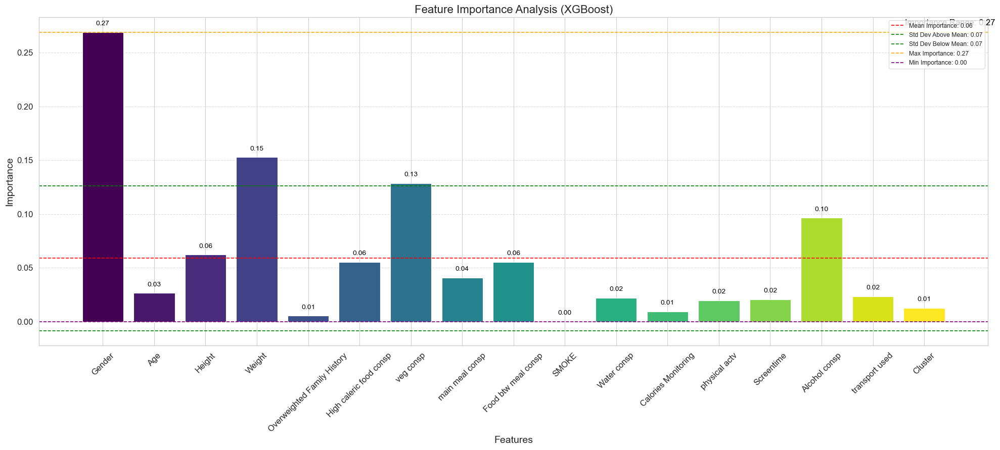

In [93]:
from sklearn.preprocessing import LabelEncoder  # For encoding categorical variables
# Assuming df_train contains your dataset
# Define X (features) and y (target variable)
X = df_train.drop(columns=['Obesity_Level'])
y = df_train['Obesity_Level']

# Encode target variable into numerical labels
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)

# Encode categorical features
encoder = LabelEncoder()
X_encoded = X.copy()
for col in X_encoded.columns:
    if X_encoded[col].dtype == 'object':
        X_encoded[col] = encoder.fit_transform(X_encoded[col])

# Initialize the XGBoost classifier
model_xgb = xgb.XGBClassifier()

# Train the model
model_xgb.fit(X_encoded, y_encoded)

# Get feature importances
feature_importances_xgb = model_xgb.feature_importances_

# Calculate statistical information
mean_importance = np.mean(feature_importances_xgb)
std_importance = np.std(feature_importances_xgb)
max_importance = np.max(feature_importances_xgb)
importance_range = max_importance - np.min(feature_importances_xgb)

# Count the occurrences of each feature
feature_counts = X_encoded.apply(lambda x: x.value_counts()).fillna(0).astype(int)

# Visualize feature importances
plt.figure(figsize=(20, 9))  # Increase figure size

# Define color palette
colors = plt.cm.viridis(np.linspace(0, 1, len(X_encoded.columns)))

bars = plt.bar(X_encoded.columns, feature_importances_xgb, color=colors)  # Change color
plt.xlabel('Features', fontsize=14)  # Increase font size
plt.ylabel('Importance', fontsize=14)  # Increase font size
plt.title('Feature Importance Analysis (XGBoost)', fontsize=16)  # Increase font size
plt.xticks(rotation=45, fontsize=12)  # Rotate x-axis labels and increase font size
plt.yticks(fontsize=12)  # Increase font size for y-axis ticks
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines for better readability

# Add statistical information
plt.axhline(mean_importance, color='red', linestyle='--', label=f'Mean Importance: {mean_importance:.2f}')
plt.axhline(mean_importance + std_importance, color='green', linestyle='--', label=f'Std Dev Above Mean: {std_importance:.2f}')
plt.axhline(mean_importance - std_importance, color='green', linestyle='--', label=f'Std Dev Below Mean: {std_importance:.2f}')
plt.axhline(max_importance, color='orange', linestyle='--', label=f'Max Importance: {max_importance:.2f}')
plt.axhline(np.min(feature_importances_xgb), color='purple', linestyle='--', label=f'Min Importance: {np.min(feature_importances_xgb):.2f}')
plt.text(len(X_encoded.columns)-0.5, max_importance + 0.005, f'Importance Range: {importance_range:.2f}', ha='center', va='bottom', fontsize=12, color='black')

# Add feature importance values above each bar
for i, importance in enumerate(feature_importances_xgb):
    plt.text(i, importance + 0.005, f'{importance:.2f}', ha='center', va='bottom', fontsize=10, color='black')

plt.legend()

plt.tight_layout()  # Adjust layout to prevent overlapping labels
plt.show()

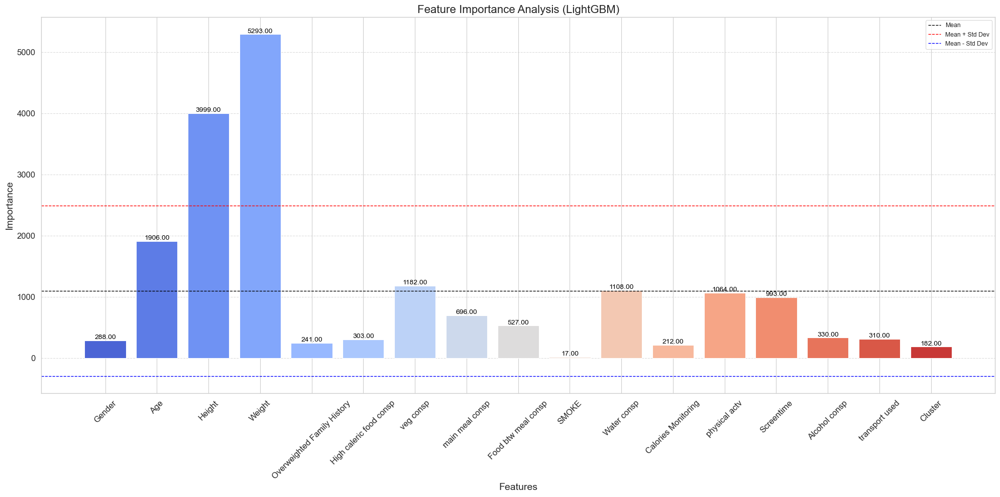

In [94]:
# Assuming df_train contains your dataset
# Define X (features) and y (target variable)
X = df_train.drop(columns=['Obesity_Level'])
y = df_train['Obesity_Level']

# Encode categorical features
encoder = LabelEncoder()
X_encoded = X.copy()
for col in X_encoded.columns:
    if X_encoded[col].dtype == 'object':
        X_encoded[col] = encoder.fit_transform(X_encoded[col])

# Initialize the LightGBM classifier
model_lgb = lgb.LGBMClassifier(verbosity=-1)

# Train the model
model_lgb.fit(X_encoded, y)

# Get feature importances
feature_importances_lgb = model_lgb.feature_importances_

# Create a color palette
colors = sns.color_palette("coolwarm", len(X_encoded.columns))

# Visualize feature importances
plt.figure(figsize=(20, 10))  # Increase figure size
bars = plt.bar(X_encoded.columns, feature_importances_lgb, color=colors)  # Use color palette
plt.xlabel('Features', fontsize=14)  # Increase font size
plt.ylabel('Importance', fontsize=14)  # Increase font size
plt.title('Feature Importance Analysis (LightGBM)', fontsize=16)  # Increase font size
plt.xticks(rotation=45, fontsize=12)  # Rotate x-axis labels and increase font size
plt.yticks(fontsize=12)  # Increase font size for y-axis ticks
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines for better readability

# Add statistical information
mean_importance = np.mean(feature_importances_lgb)
std_importance = np.std(feature_importances_lgb)
plt.axhline(mean_importance, color='black', linestyle='--', linewidth=1, label='Mean')  # Add mean line
plt.axhline(mean_importance + std_importance, color='red', linestyle='--', linewidth=1, label='Mean + Std Dev')  # Add mean + std dev line
plt.axhline(mean_importance - std_importance, color='blue', linestyle='--', linewidth=1, label='Mean - Std Dev')  # Add mean - std dev line
plt.legend()  # Show legend

for bar, importance in zip(bars, feature_importances_lgb):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.005,
             f'{importance:.2f}', ha='center', va='bottom', fontsize=10, color='black')

plt.tight_layout()  # Adjust layout to prevent overlapping labels
plt.show()

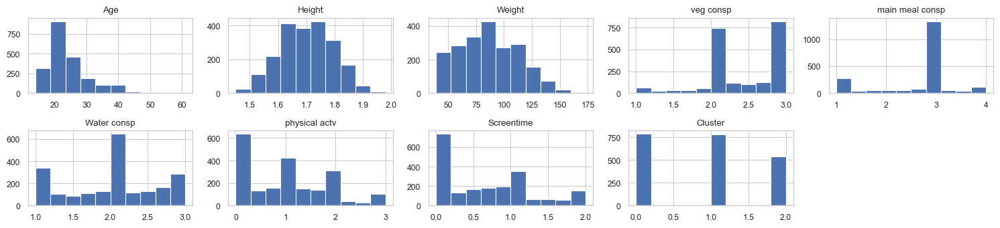

In [95]:
# Define columns to plot (excluding non-numeric columns)
columns_to_plot = df_train.select_dtypes(include=['number']).columns

# Plotting
plt.figure(figsize=(15, 10))
for i, col in enumerate(columns_to_plot, 1):
    plt.subplot(6, 5, i)
    df_train[col].hist()
    plt.title(col)
plt.tight_layout()
plt.show()

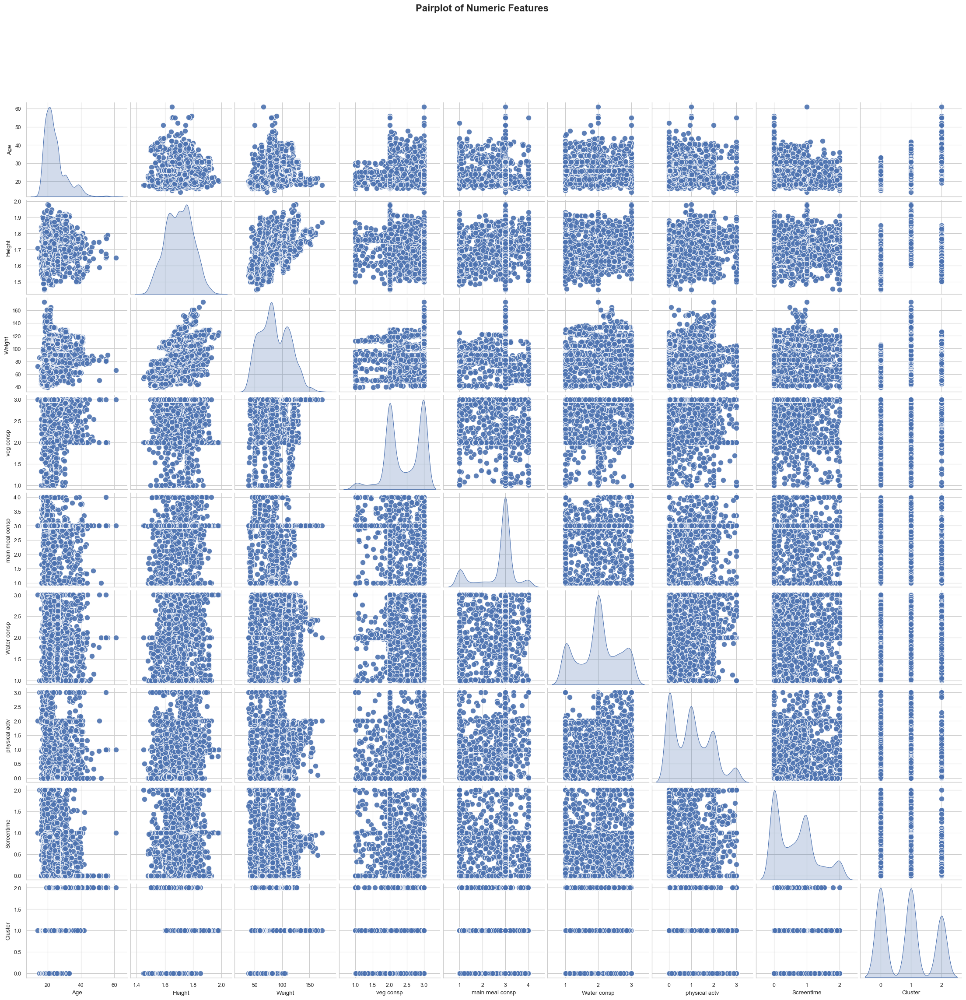

In [96]:
# Select numeric columns
numeric_columns = df_train.select_dtypes(include='number').columns

# Set style and context
sns.set(style="whitegrid", context="paper")

# Plot pairplot
pairplot = sns.pairplot(df_train[numeric_columns], markers='o', diag_kind='kde', 
                        plot_kws={'alpha': 0.9, 's': 80, 'edgecolor': 'w'})

# Customize labels and title
pairplot.fig.suptitle('Pairplot of Numeric Features', y=1.02, fontsize=16, fontweight='bold')
plt.subplots_adjust(top=0.92)


plt.show()

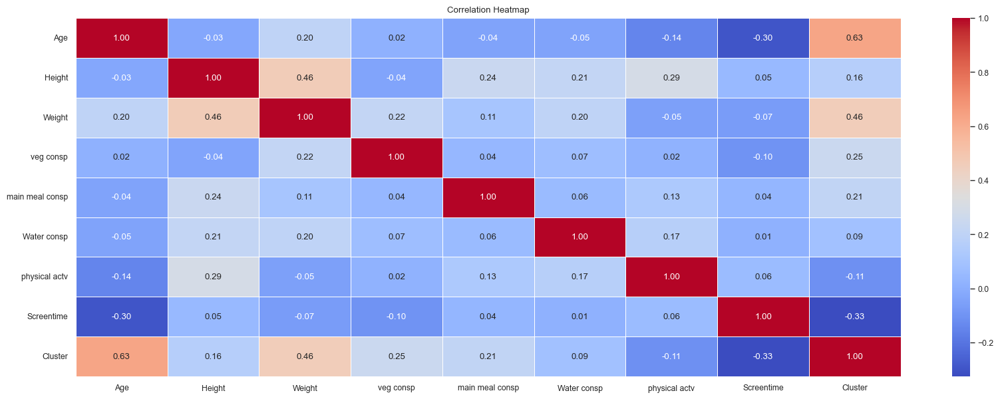

In [97]:
# Assuming df_train contains your dataset
# Select numeric columns
numeric_columns = df_train.select_dtypes(include='number')

# Calculate the correlation matrix
correlation_matrix = numeric_columns.corr()

# Define thresholds for highlighting correlations
strong_positive_threshold = 0.7
strong_negative_threshold = -0.5

# Plot the correlation heatmap
plt.figure(figsize=(20, 7))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# Add indicators for strong positive correlations
for i in range(len(correlation_matrix.columns)):
    for j in range(len(correlation_matrix.columns)):
        if i != j and abs(correlation_matrix.iloc[i, j]) >= strong_positive_threshold:
            plt.text(j + 0.5, i + 0.5, '\u25B2', ha='center', va='center', color='red', fontsize=14)

# Add indicators for strong negative correlations
for i in range(len(correlation_matrix.columns)):
    for j in range(len(correlation_matrix.columns)):
        if i != j and correlation_matrix.iloc[i, j] <= strong_negative_threshold:
            plt.text(j + 0.5, i + 0.5, '\u25BC', ha='center', va='center', color='blue', fontsize=14)

plt.title('Correlation Heatmap')

plt.show()